In [1]:
#Imports
import tensorflow as tf
import pymysql
from astropy.table import Table
import astropy.units as u
from astropy.cosmology import WMAP9 as cosmo
import pymysql
import pandas as pd
from matplotlib.colors import LogNorm
import gc
import os
import numpy as np
from DESOM import DESOM
import matplotlib.pyplot as plt
from datasets import load_spectra_data
from astropy.io import fits
from IPython.display import clear_output
import scipy
from astropy.nddata import StdDevUncertainty
from specutils import Spectrum1D, SpectralRegion
from specutils.analysis import line_flux
import config
from tqdm.notebook import tqdm
from astropy.coordinates import SkyCoord

gpus = tf.config.list_physical_devices('GPU')
if gpus:
# Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    for gpu in gpus:
        try:
            tf.config.set_logical_device_configuration(gpu,
                                                       [tf.config.LogicalDeviceConfiguration(memory_limit=1024)])
            logical_gpus = tf.config.list_logical_devices('GPU')
            print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
        except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
            print(e)
#Overhead: Matplotlib Parameters
import matplotlib as mpl
mpl.rcParams['text.usetex']=True
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'DejaVu Sans'
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'DejaVu Sans'
mpl.rcParams['mathtext.it'] = 'DejaVu Sans:italic'
mpl.rcParams['mathtext.bf'] = 'DejaVu Sans:bold'
mpl.rcParams.update(
    {
        'text.usetex': False,
        'font.family': 'sans-serif',
        'mathtext.fontset': 'dejavusans',
    }
)
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.linewidth'] = 3
plt.rcParams['xtick.major.size'] = 10
plt.rcParams['xtick.minor.size'] = 5
plt.rcParams['ytick.major.size'] = 10
plt.rcParams['ytick.minor.size'] = 5
plt.rcParams['ytick.major.width'] = 2
plt.rcParams['ytick.minor.width'] = 2
plt.rcParams['xtick.major.width'] = 2
plt.rcParams['xtick.minor.width'] = 2
mpl.rcParams['xtick.minor.visible'] = True
mpl.rcParams['ytick.minor.visible'] = True
mpl.rcParams['xtick.direction'] = 'in'
mpl.rcParams['ytick.direction'] = 'in'
mpl.rcParams['ytick.major.pad'] = 9
mpl.rcParams['ytick.right'] = True
mpl.rcParams['xtick.top'] = True
plt.rcParams['axes.titlesize'] = 50
mpl.rcParams['figure.dpi'] = 500
from matplotlib.ticker import FormatStrFormatter

#define the SOM and verify that it works.
root = os.getcwd()
encoder_dims = [2048]
som = DESOM(encoder_dims= encoder_dims, ae_type = 'cnn1D', map_size = [32,32])
#Specify Gamma and Optimizer
gamma = 0.005
optimizer = 'adam'
#Initialize DESOM
som.initialize(ae_act ='relu', ae_init ='glorot_uniform')
#Compile
som.compile(gamma, optimizer)
som.load_ae_weights("/arc/home/rbickley/DSOM-resources/DSOM-runs/v0/ae_weights-epoch50.h5")
som.load_weights('/arc/home/rbickley/DSOM-resources/DSOM-runs/v2/DESOM_model_final.h5')
prototypes = som.prototypes
decoded_prototypes = som.decode(prototypes)
#Setup Map Size
map_size = som.map_size
upper_lim = map_size[0] * map_size[1]
fig, ax = plt.subplots(map_size[0], map_size[1], figsize=(50,50),dpi=300,sharex=True,sharey=True)
#Iterate over each and every prototype
for k in range(upper_lim):
    x = decoded_prototypes[k]
    ax[k // map_size[1]][k % map_size[1]].plot(np.linspace(3000,9000,2048),x, linewidth=.2,color='black')
for a in ax.flatten():
    a.tick_params(axis='both', which='major', labelsize=10)
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
plt.xlabel('wavelength $\mathrm{\AA}$')
plt.ylabel('normalized relative flux, arbitrary')
fig.subplots_adjust(hspace=.1)
plt.show()

2023-07-05 21:47:35.366521: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


sss
Shape before flattening : (256, 256)
Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 2048)]            0         
                                                                 
 reshape (Reshape)           (None, 2048, 1)           0         
                                                                 
 conv1d (Conv1D)             (None, 2048, 32)          288       
                                                                 
 re_lu (ReLU)                (None, 2048, 32)          0         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1024, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 1024, 64)          14400     
                  

2023-07-05 21:47:40.801269: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-07-05 21:47:40.801328: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-07-05 21:47:40.801364: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (make-plots): /proc/driver/nvidia/version does not exist
2023-07-05 21:47:40.822874: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, 2048)]            0         
                                                                 
 reshape (Reshape)           (None, 2048, 1)           0         
                                                                 
 conv1d (Conv1D)             (None, 2048, 32)          288       
                                                                 
 re_lu (ReLU)                (None, 2048, 32)          0         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1024, 32)         0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 1024, 64)          14400     
                                                       

In [2]:
#Prepare the data, names, and redshifts
#names = [i[1] for i in np.load('../name-and-z.npz')['data']]
#zs = [i[0] for i in np.load('../name-and-z.npz')['data']]
#X_train = [i for i in np.load('../1dsp_data_norm.npz',allow_pickle=True)['data']]

#names =  np.array([names[i] for i in range(len(names)) if np.std(X_train[i])!=0])
#zs =  np.array([zs[i] for i in range(len(zs)) if np.std(X_train[i])!=0])
#X_train =  np.array([i/np.amax(i) for i in X_train if np.std(i)!=0])

som_df = pd.read_csv('som_df.csv')

#_,maps = som.model.predict(X_train)
maps = np.load('dr7-som-maps.npz')['data']

maps_normed = np.array([(1-np.array(i))/np.sum(1-np.array(i)) for i in maps])

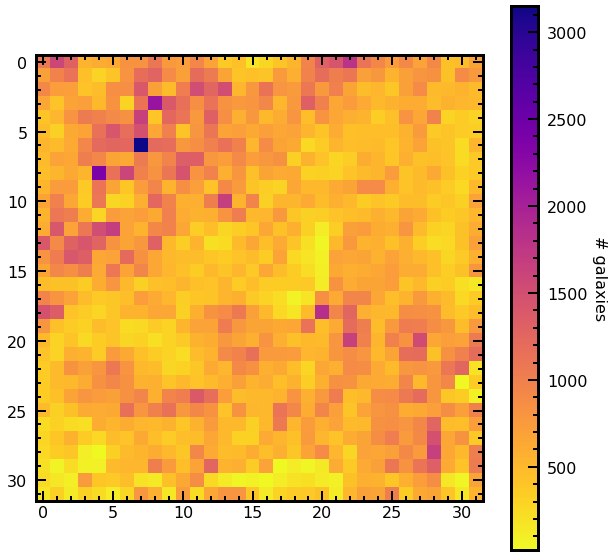

In [222]:
#ALL sources
fig,axs = plt.subplots(figsize=[10,10])
mask = (~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# galaxies', rotation=270,labelpad=20)
plt.show()

In [227]:
print(binned_errs.shape)
print(binned_maps.shape)

(650363,)
(32, 32)


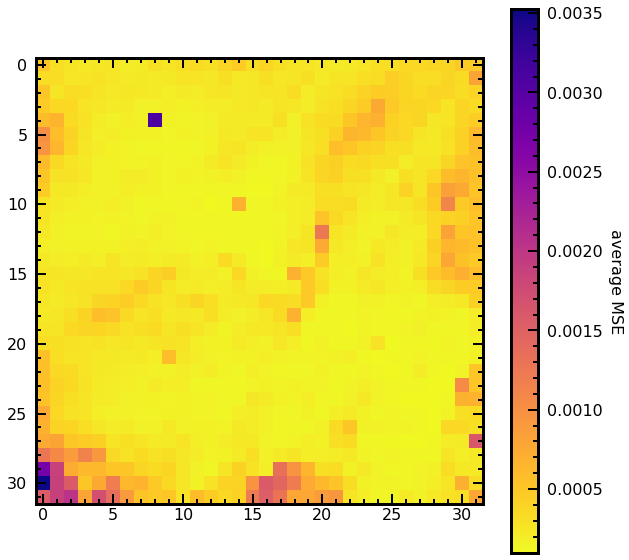

In [229]:
#ALL sources
fig,axs = plt.subplots(figsize=[10,10])
mask = (~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
binned_errs = np.array([np.amin(i) for i in maps[indices]])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_errs = np.array([np.mean(binned_errs[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_errs,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('average MSE', rotation=270,labelpad=20)
plt.show()

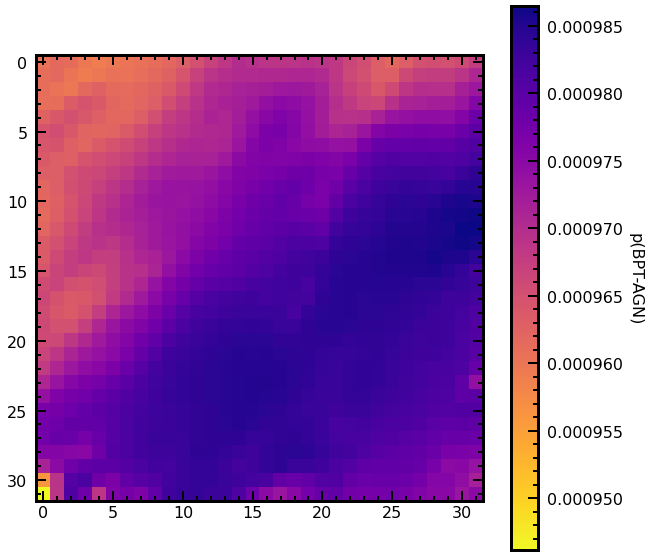

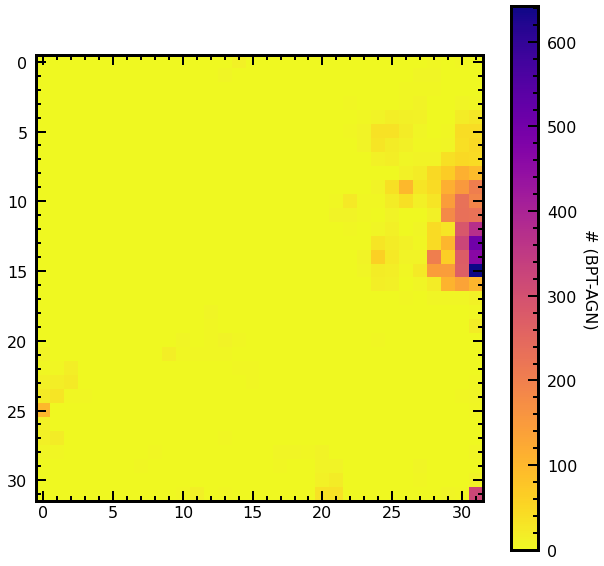

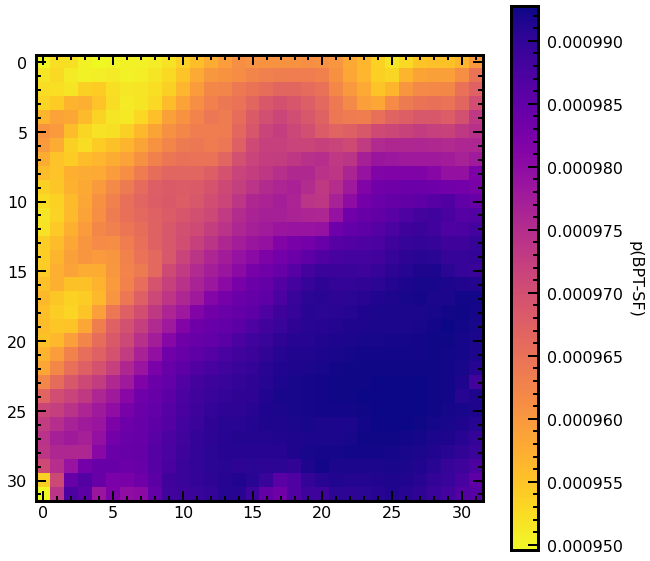

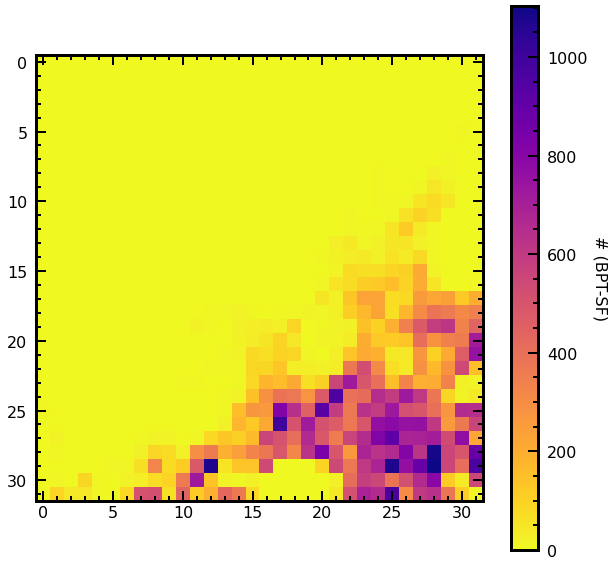

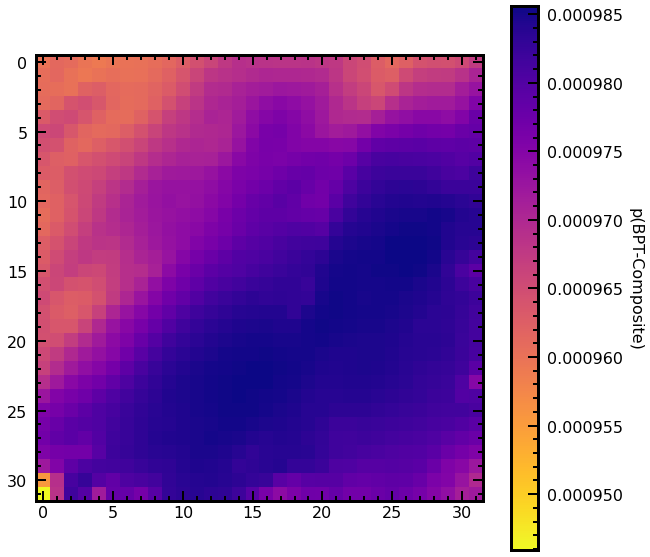

...

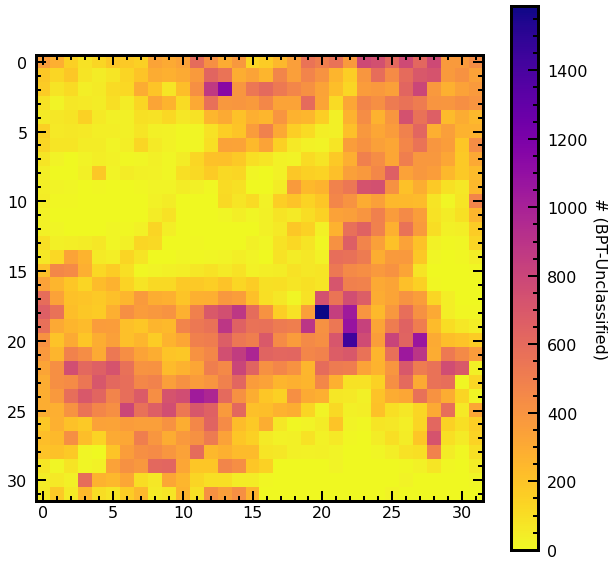

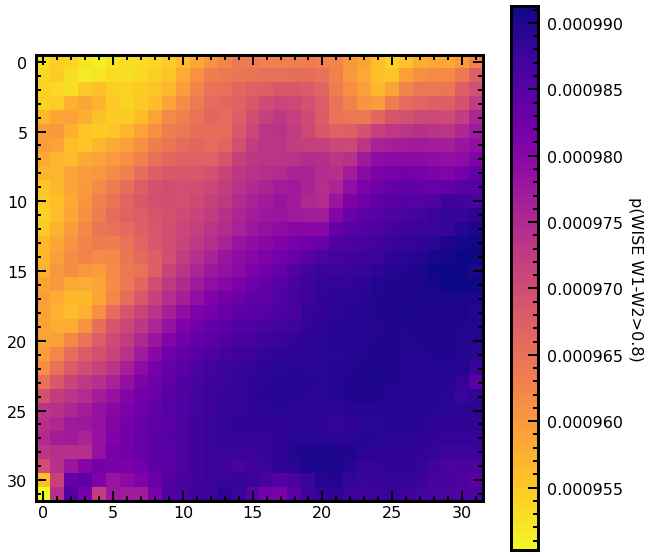

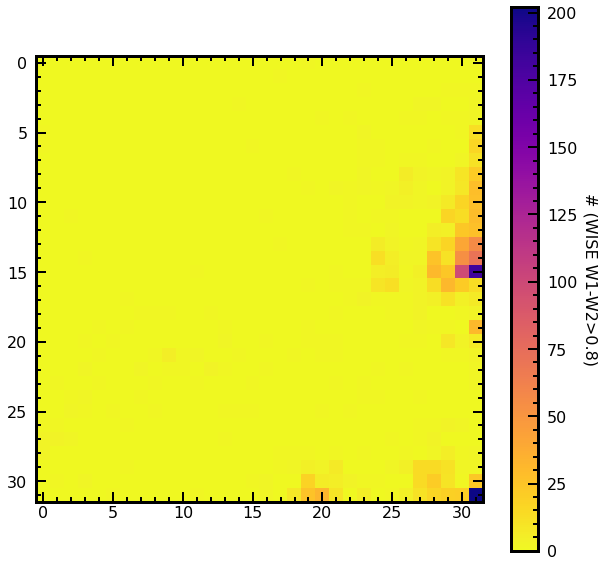

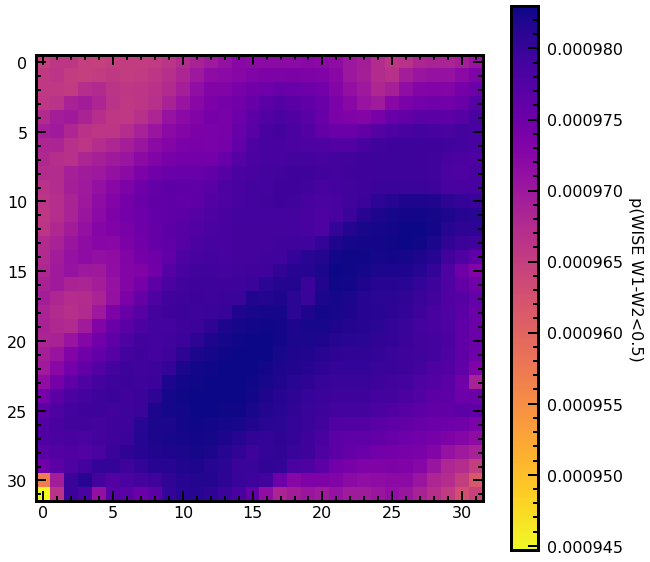

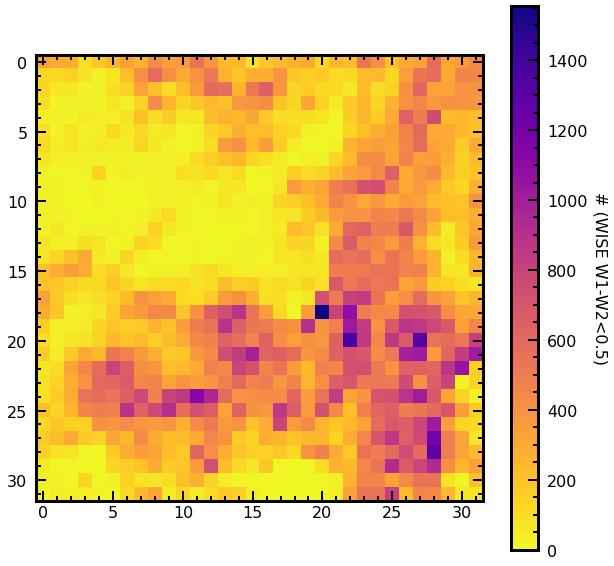

/opt/conda/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


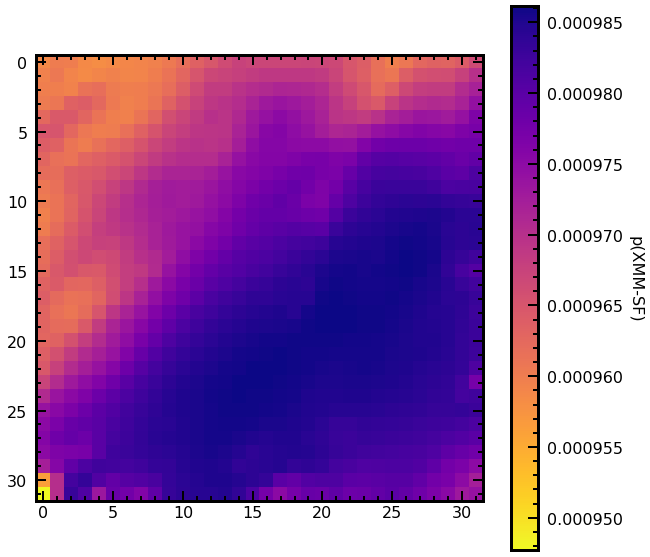

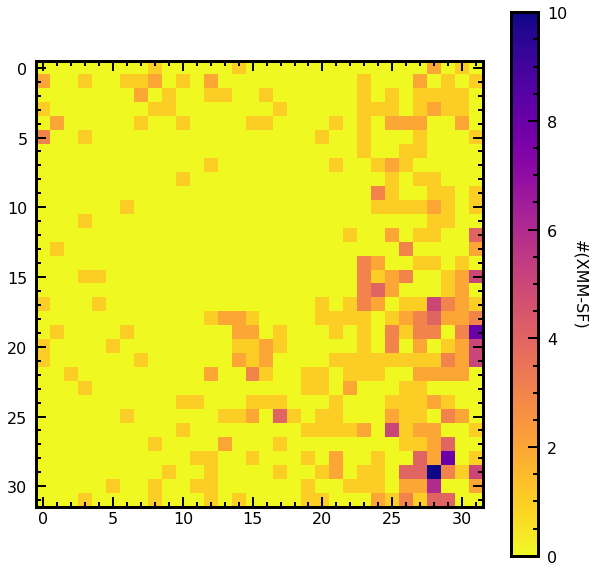

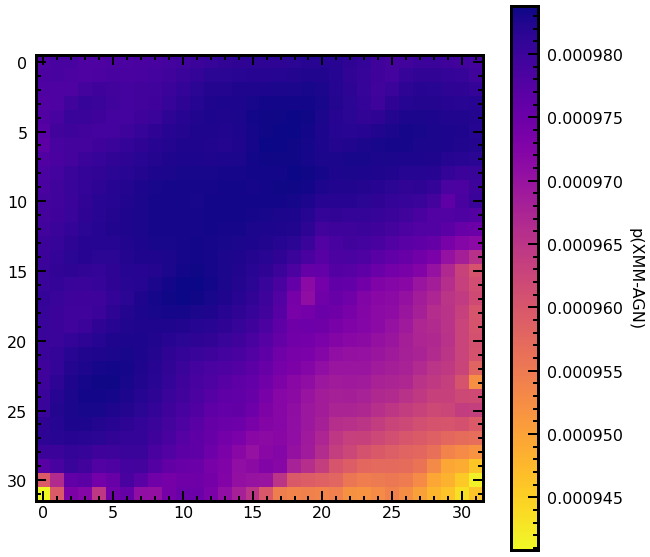

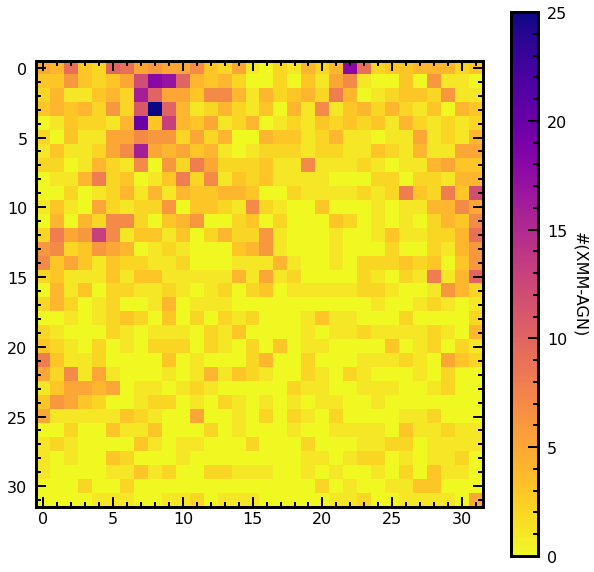

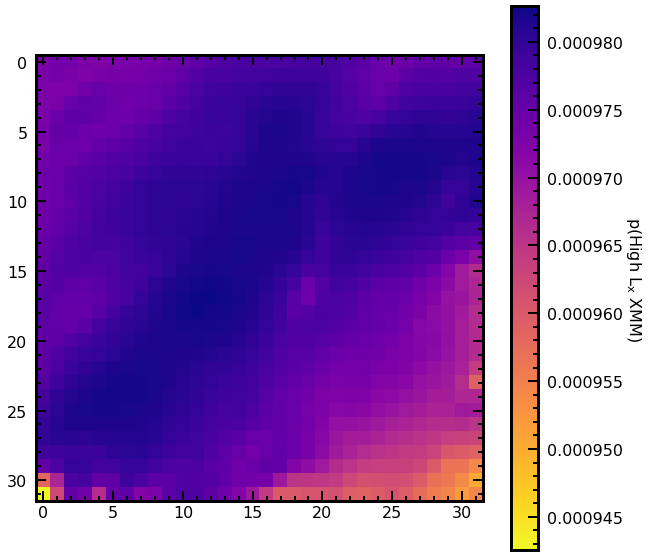

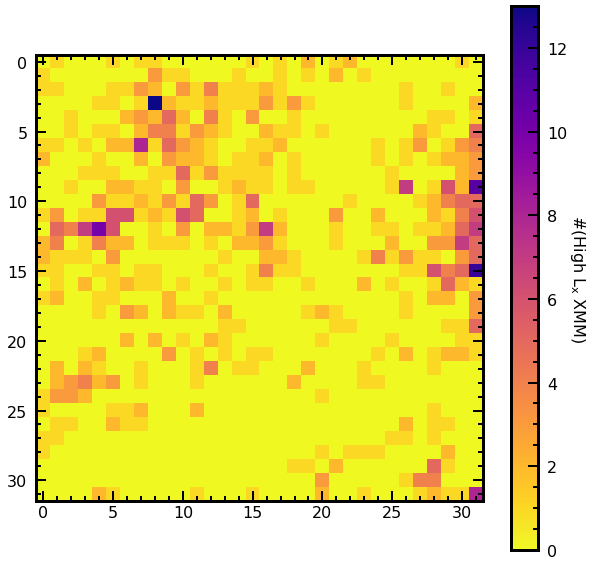

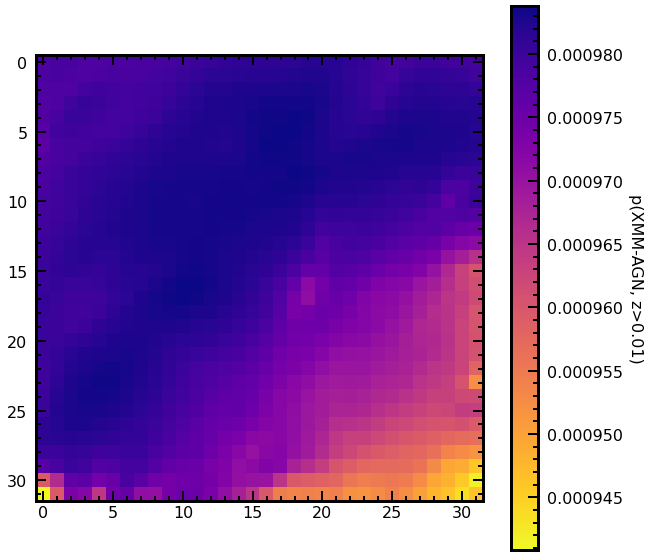

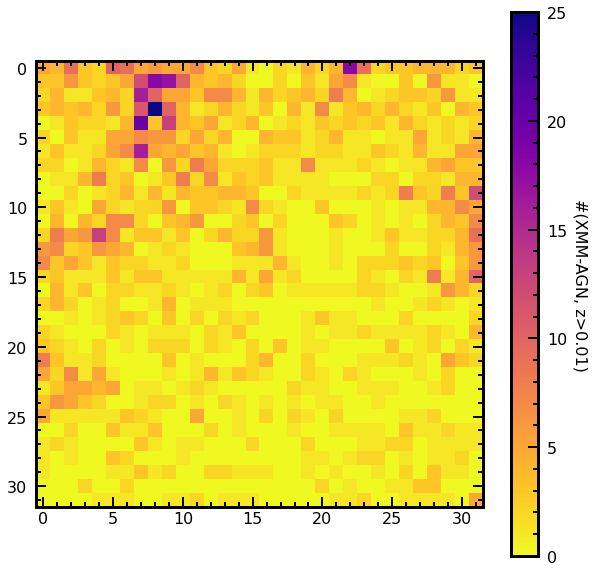

/tmp/ipykernel_277/2887123192.py:189: RuntimeWarning: invalid value encountered in true_divide
  xagn_purity = count_xagn/(count_xagn+count_xsf)


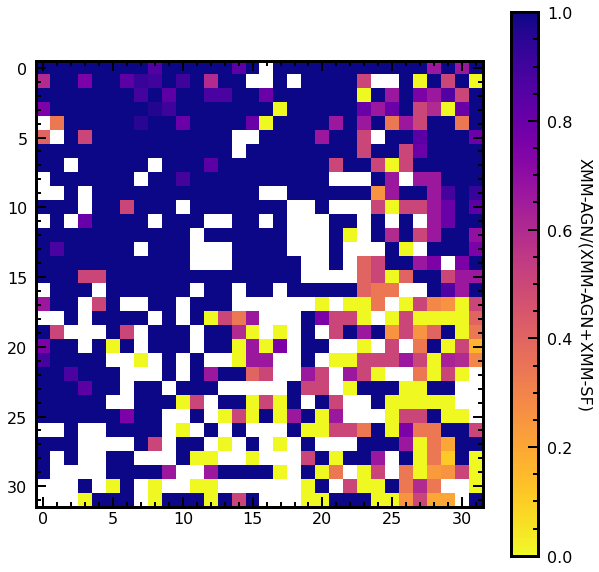

/tmp/ipykernel_277/2887123192.py:197: RuntimeWarning: invalid value encountered in true_divide
  xsf_purity = count_xsf/(count_xagn+count_xsf)


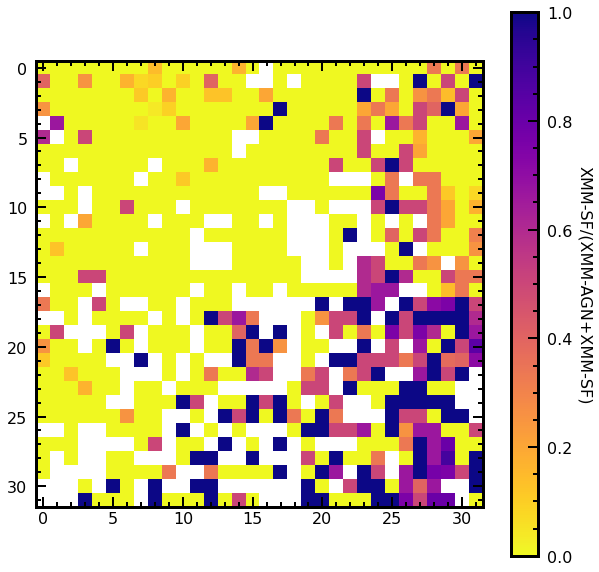

In [6]:
#BPT AGN
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']>=5)&(som_df['new_K01_flag']=='AGN')&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(BPT-AGN)', rotation=270,labelpad=20)
plt.show()
#Single best BPT AGN
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (BPT-AGN)', rotation=270,labelpad=20)
plt.show()

#BPT SF
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']>=5)&(som_df['new_K03_flag']=='SF')&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(BPT-SF)', rotation=270,labelpad=20)
plt.show()
#Single best BPT SF
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (BPT-SF)', rotation=270,labelpad=20)
plt.show()

#BPT Comp
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']>=5)&(som_df['new_K03_flag']=='AGN')&(som_df['new_K01_flag']=='SF')&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(BPT-Composite)', rotation=270,labelpad=20)
plt.show()
#Single best BPT Comp
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (BPT-Composite)', rotation=270,labelpad=20)
plt.show()

#BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']<5)&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(BPT-Unclassified)', rotation=270,labelpad=20)
plt.show()
#Single best BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (BPT-Unclassified)', rotation=270,labelpad=20)
plt.show()

#WISE AGN
fig,axs = plt.subplots(figsize=[10,10])
mask = ((som_df['w1mpro']-som_df['w2mpro'])>0.8)&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(WISE W1-W2>0.8)', rotation=270,labelpad=20)
plt.show()
#Single best WISE AGN
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (WISE W1-W2>0.8)', rotation=270,labelpad=20)
plt.show()

#WISE non-AGN
fig,axs = plt.subplots(figsize=[10,10])
mask = ((som_df['w1mpro']-som_df['w2mpro'])<0.5)&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(WISE W1-W2<0.5)', rotation=270,labelpad=20)
plt.show()
#Single best WISE non-AGN
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (WISE W1-W2<0.5)', rotation=270,labelpad=20)
plt.show()

no_crit = (np.log10(10**(som_df['sfr_x2_gsw'].astype(float)))>np.log10(som_df['L_X'].astype(float))-(40.180456064458134+0.6))&(som_df['hard_band_ul_flags']==int(8))&(~np.isnan(som_df['spec_ind']))
agn_crit = (np.log10(10**(som_df['sfr_x2_gsw'].astype(float)))<np.log10(som_df['L_X'].astype(float))-(40.180456064458134+0.6))&(som_df['hard_band_ul_flags']==int(8))&(~np.isnan(som_df['spec_ind']))
ul_agn_crit = (np.log10(som_df['L_X'].astype(float))>=42)&(som_df['hard_band_ul_flags']==int(8))&(~np.isnan(som_df['spec_ind']))

#4XMM-SF
fig,axs = plt.subplots(figsize=[10,10])
mask = no_crit
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(XMM-SF)', rotation=270,labelpad=20)
plt.show()

fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
count_xsf = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(count_xsf,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('#(XMM-SF)', rotation=270,labelpad=20)
plt.show()

#4XMM AGN
fig,axs = plt.subplots(figsize=[10,10])
mask = agn_crit
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(XMM-AGN)', rotation=270,labelpad=20)
plt.show()

fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
count_xagn = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(count_xagn,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('#(XMM-AGN)', rotation=270,labelpad=20)
plt.show()

#High-luminosity 4XMM
fig,axs = plt.subplots(figsize=[10,10])
mask = ul_agn_crit
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(High $\mathrm{L_{x}}$ XMM)', rotation=270,labelpad=20)
plt.show()

fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('#(High $\mathrm{L_{x}}$ XMM)', rotation=270,labelpad=20)
plt.show()

#Stellar contamination in SDSS?
#4XMM AGN z>0.01
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['z_spec']>0.01)&agn_crit
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(XMM-AGN, z>0.01)', rotation=270,labelpad=20)
plt.show()

fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('#(XMM-AGN, z>0.01)', rotation=270,labelpad=20)
plt.show()

#I want to plot the relative excess of XMM AGN over XMM SF in each grid cell. I should start with the 2 XMM plots from the code directly above.
#All X SF and All X AGN combined. Question: What is the purity of an XAGN sample drawn from each cell?
fig,axs = plt.subplots(figsize=[10,10])
xagn_purity = count_xagn/(count_xagn+count_xsf)
plt.imshow(xagn_purity,cmap='plasma_r')
cbar = plt.colorbar()
cbar.ax.set_ylabel('XMM-AGN/(XMM-AGN+XMM-SF)', rotation=270,labelpad=20)
plt.show()

#Inverse: purity of XSF using each cell
fig,axs = plt.subplots(figsize=[10,10])
xsf_purity = count_xsf/(count_xagn+count_xsf)
plt.imshow(xsf_purity,cmap='plasma_r')
cbar = plt.colorbar()
cbar.ax.set_ylabel('XMM-SF/(XMM-AGN+XMM-SF)', rotation=270,labelpad=20)
plt.show()

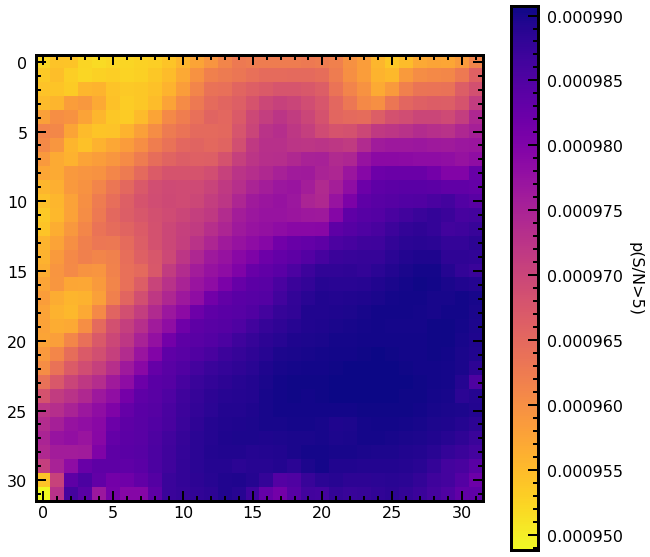

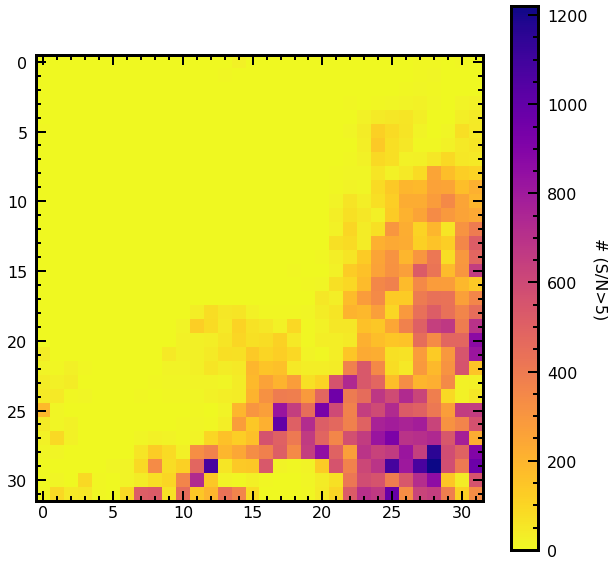

In [6]:
#BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']>5)&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(S/N>5)', rotation=270,labelpad=20)
plt.show()
#Single best BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (S/N>5)', rotation=270,labelpad=20)
plt.show()

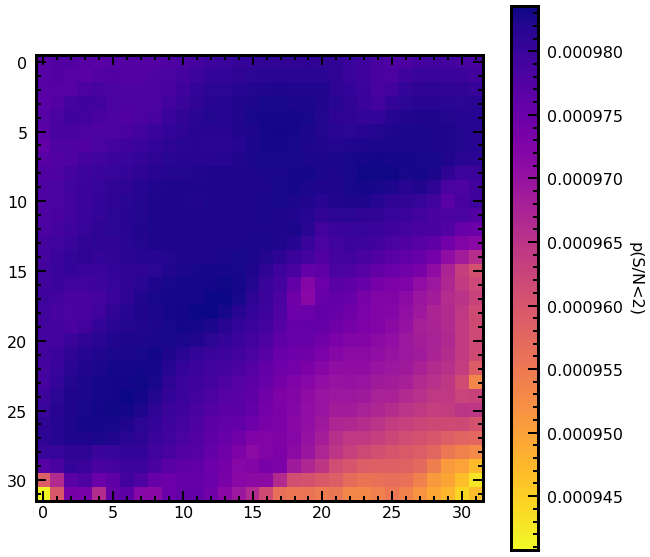

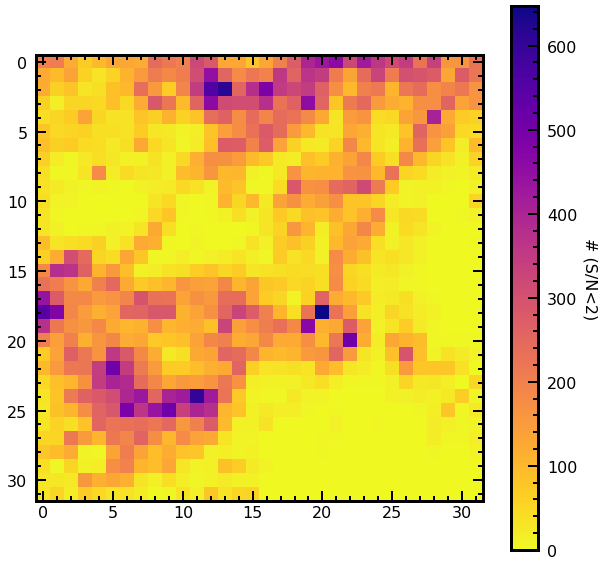

In [8]:
#BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
mask = (som_df['agn_sn']<2)&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
these_maps = (np.sum(maps_normed[indices],axis=0)/len(indices)).reshape(32,32)
a = axs.imshow(these_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('p(S/N<2)', rotation=270,labelpad=20)
plt.show()
#Single best BPT Unc
fig,axs = plt.subplots(figsize=[10,10])
binned_maps = np.array([np.argmin(i) for i in maps[indices]])
binned_maps = np.array([len(binned_maps[binned_maps==i])for i in range(1024)]).reshape(32,32)
a = axs.imshow(binned_maps,cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('# (S/N<2)', rotation=270,labelpad=20)
plt.show()

In [4]:
all_cell_best = np.array([np.argmin(i) for i in maps])
best_cells = []
for index,row in som_df.iterrows():
    if ~np.isnan(row['spec_ind']):
        best_cell = all_cell_best[int(row['spec_ind'])]
        best_cells.append(best_cell)
    else:
        best_cells.append('NaN')
som_df['best_cells']=best_cells

In [33]:
#Make a map that captures:
#The fraction of XMM-AGN recovered by BPT in each cell
#Purity of the same
#The fraction of XMM-AGN recovered by WISE in each cell
#Purity of the same
#Four maps but I think we should make all of these calculations in one run
def cell_eval(cell):
    print('doing cell {}'.format(str(cell)))
    #xmm
    XMM_agn_slice = len(som_df[(agn_crit)&(som_df['best_cells']==cell)])
    print(XMM_agn_slice)
    #bpt
    bpt_tp_slice = len(som_df[(agn_crit)&(som_df['agn_sn']>=5)&(som_df['new_K01_flag']=='AGN')&(som_df['best_cells']==cell)])
    print(bpt_tp_slice)
    bpt_fn_slice = len(som_df[(no_crit)&(som_df['agn_sn']>=5)&(som_df['new_K01_flag']=='AGN')&(som_df['best_cells']==cell)])
    print(bpt_fn_slice)
    #wise
    wise_tp_slice = len(som_df[(agn_crit)&((som_df['w1mpro']-som_df['w2mpro'])>0.8)&(som_df['best_cells']==cell)])
    print(wise_tp_slice)
    wise_fn_slice = len(som_df[(no_crit)&((som_df['w1mpro']-som_df['w2mpro'])>0.8)&(som_df['best_cells']==cell)])
    print(wise_fn_slice)
    #calcs
    #Will return (BPT acc, BPT pur, WISE acc, WISE pur)
    print('calculating')
    if (XMM_agn_slice==0):
        print('no XMM SF or AGN in cell {}'.format(str(cell)))
        bpt_agn_acc = 'NaN'
        bpt_agn_pur = 'NaN'
        wise_agn_acc = 'NaN'
        wise_agn_pur = 'NaN'
    else:
        try:
            bpt_agn_acc = bpt_tp_slice/XMM_agn_slice
        except:
            #this would have to mean that there are XMM SF but no XMM AGN
            bpt_agn_acc = 'NaN'
        try:
            bpt_agn_pur = bpt_tp_slice/(bpt_tp_slice+bpt_fn_slice)
        except:
            #this would mean that the tp_slice and fn_slice are both zero.
            bpt_agn_pur = 'NaN'
        try:
            wise_agn_acc = wise_tp_slice/XMM_agn_slice
        except:
            #this would have to mean that there are XMM SF but no XMM AGN
            wise_agn_acc = 'NaN'
        try:
            wise_agn_pur = wise_tp_slice/(wise_tp_slice+wise_fn_slice)
        except:
            #only happens if tp and fn are both zero for wise
            wise_agn_pur = 'NaN'
    gc.collect()
    clear_output(wait=True)
    return([bpt_agn_acc,bpt_agn_pur,wise_agn_acc,wise_agn_pur])
cell_evals = np.array([cell_eval(cell) for cell in range(1024)])

doing cell 1023
5
4
0
2
0
calculating


array([[0. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 0. , nan],
       [0. , 0. , 0. , ..., 0. , 0. , 0. ],
       ...,
       [0. , nan, nan, ..., 0. , 0. , nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., 0. , nan, 0.8]])

/tmp/ipykernel_340/3065570707.py:6: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


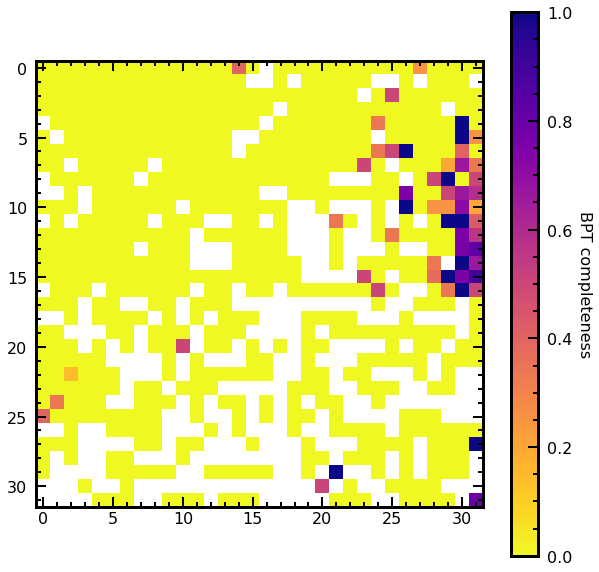

/tmp/ipykernel_340/3065570707.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


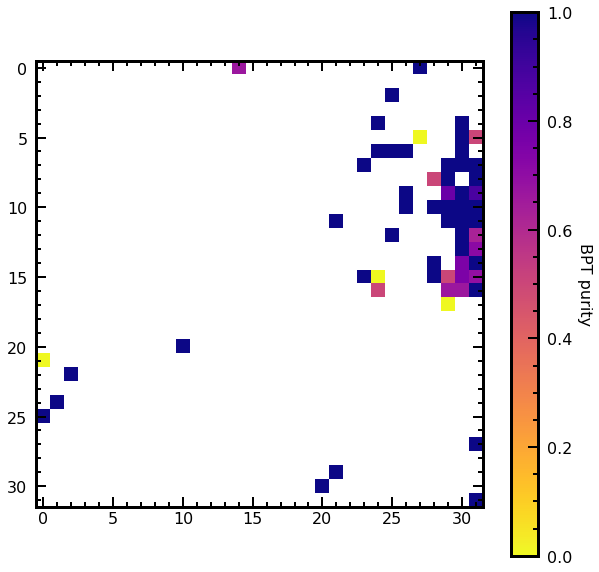

/tmp/ipykernel_340/3065570707.py:28: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


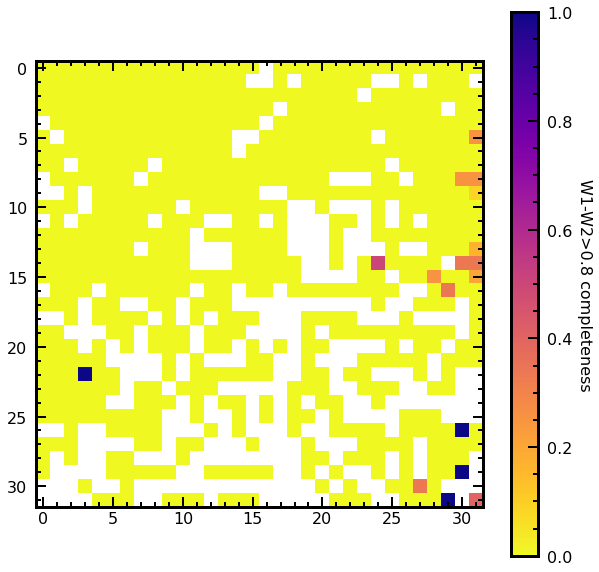

/tmp/ipykernel_340/3065570707.py:39: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


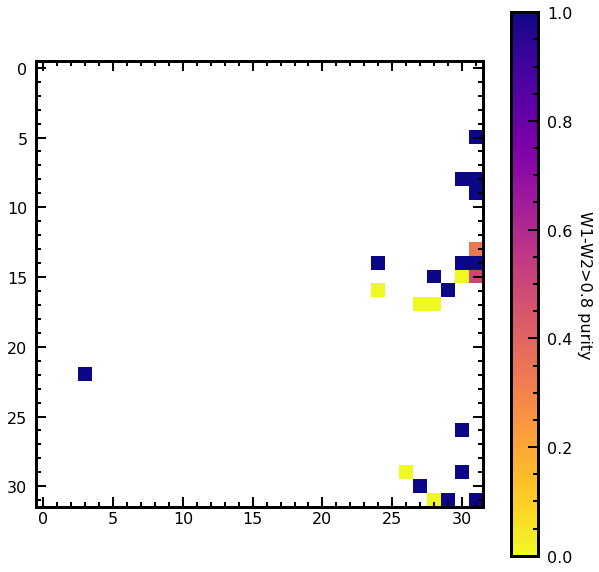

In [39]:
#BPT Acc.
fig,axs = plt.subplots(figsize=[10,10])
agn_accs = np.array([i[0] for i in cell_evals]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_accs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('BPT completeness', rotation=270,labelpad=20)
plt.show()

#BPT Pur.
fig,axs = plt.subplots(figsize=[10,10])
agn_purs = np.array([i[1] for i in cell_evals]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_purs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('BPT purity', rotation=270,labelpad=20)
plt.show()

#WISE Acc.
fig,axs = plt.subplots(figsize=[10,10])
agn_accs = np.array([i[2] for i in cell_evals]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_accs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('W1-W2>0.8 completeness', rotation=270,labelpad=20)
plt.show()

#WISE Pur.
fig,axs = plt.subplots(figsize=[10,10])
agn_purs = np.array([i[3] for i in cell_evals]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_purs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('W1-W2>0.8 purity', rotation=270,labelpad=20)
plt.show()

In [60]:
db = pymysql.connect(host='lauca.phys.uvic.ca',db='sdss',user='rbickley',passwd='123Sdss!@#h')
dbcmd = 'select objID, fiberID, plate, MJD, modelMag_u, modelMag_g, modelMag_r, modelMag_i, modelMag_z from dr7_uberuber where z_spec<0.3 and specClass != 1 and specClass !=5 and specClass !=6'
c = db.cursor()
c.execute(dbcmd)
db_data = c.fetchall()
c.close()
print(len(db_data))
photo_df = pd.DataFrame({'objID':np.array([i[0] for i in db_data]).astype(int),
                       'fiberID':np.array([i[1] for i in db_data]).astype(int),
                       'plate':np.array([i[2] for i in db_data]).astype(int),
                       'MJD':np.array([i[3] for i in db_data]).astype(int),
                       'M_u':[i[4] for i in db_data],
                       'M_g':[i[5] for i in db_data],
                       'M_r':[i[6] for i in db_data],
                       'M_i':[i[7] for i in db_data],
                       'M_z':[i[8] for i in db_data]})

photo_df_new = pd.merge(som_df, photo_df,  how='left', left_on=['objID','plate','MJD','fiberID'], right_on=['objID','plate','MJD','fiberID'])
photo_df_new

689190


,Unnamed: 0,objID,specObjID,specClass,ra,decl,fiberID,plate,MJD,z_spec,...,w2sigmpro,fname,spec_ind,L_X,best_cells,M_u,M_g,M_r,M_i,M_z
0,0,587722953304310243,96486455290888192,2,237.261959,0.259829,501,342,51691,0.034640,...,0.054,spec-0342-51691-0501.fits.gz,329882.0,NaN,61,19.2840,17.4664,16.5527,16.0774,15.7121
1,1,587722953304310184,96486455341219840,2,237.217324,0.344328,513,342,51691,0.094344,...,NaN,spec-0342-51691-0513.fits.gz,349921.0,NaN,236,19.8112,17.8723,16.8859,16.4044,16.0525
2,2,587722953304310091,96486455320248320,2,237.159853,0.312824,508,342,51691,0.119332,...,0.054,spec-0342-51691-0508.fits.gz,570378.0,NaN,582,20.5877,18.6821,17.7797,17.4561,17.0040
3,3,587722953304179134,96486455227973632,2,236.900346,0.369035,486,342,51691,0.113535,...,NaN,spec-0342-51691-0486.fits.gz,631838.0,NaN,137,19.5255,17.4001,16.3490,15.9079,15.5208
4,4,587722953304179097,96486455274110976,2,236.887728,0.390006,497,342,51691,0.113397,...,NaN,spec-0342-51691-0497.fits.gz,459632.0,NaN,729,18.9486,17.7388,17.1628,16.8092,16.6384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
689185,689185,588848900972413059,75375475353976832,2,147.968391,0.764449,453,267,51608,0.142734,...,0.065,spec-0267-51608-0453.fits.gz,45377.0,NaN,860,19.5272,18.3559,17.6889,17.3085,17.0936
689186,689186,588848900972150967,75375475031015424,2,147.475026,0.804604,376,267,51608,0.163227,...,NaN,spec-0267-51608-0376.fits.gz,597459.0,NaN,206,21.0625,18.7628,17.5132,16.9627,16.5422
689187,689187,588848900972281999,75375475253313536,2,147.671013,0.667271,429,267,51608,0.086682,...,0.084,spec-0267-51608-0429.fits.gz,671382.0,NaN,920,19.2377,18.1459,17.7042,17.3604,17.2796
689188,689188,588848900972282016,75375475215564800,2,147.700504,0.829560,420,267,51608,0.142124,...,NaN,spec-0267-51608-0420.fits.gz,277549.0,NaN,171,19.4155,17.5223,16.4207,15.9508,15.6324


/opt/conda/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


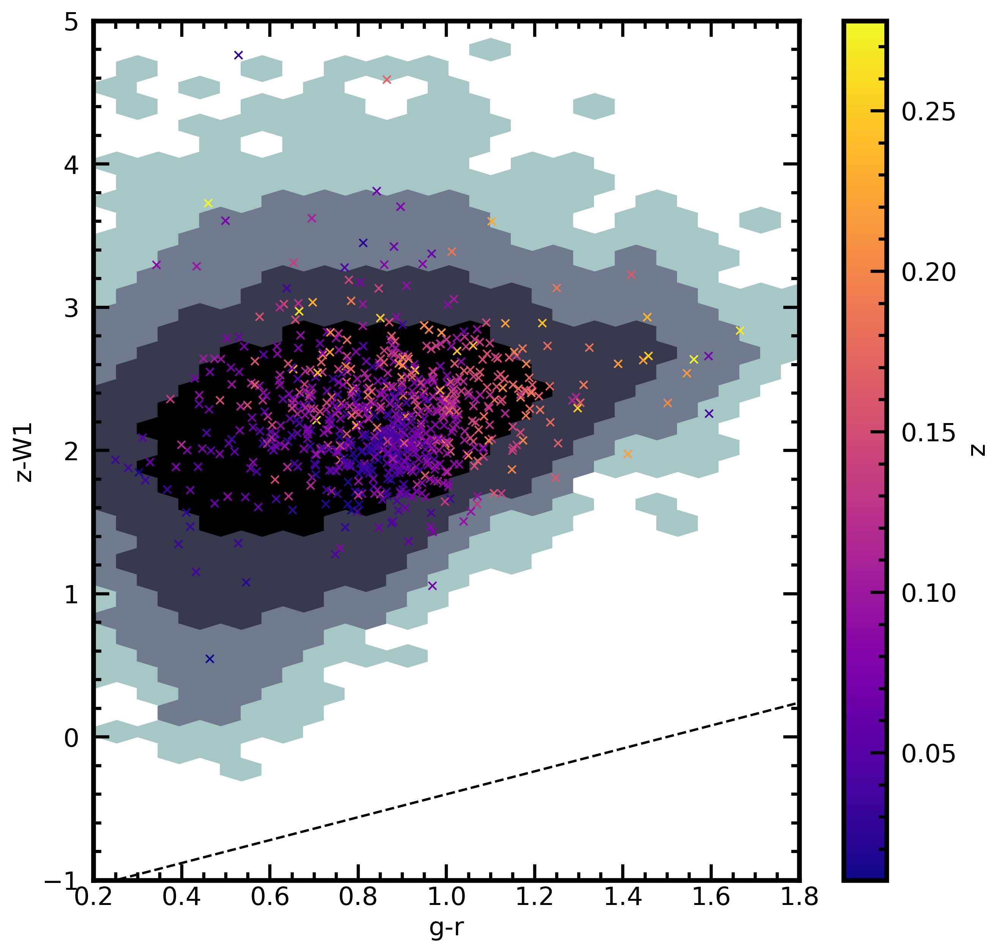

In [90]:
agn_crit_phot = (np.log10(10**(photo_df_new['sfr_x2_gsw'].astype(float)))<np.log10(photo_df_new['L_X'].astype(float))-(40.180456064458134+0.6))&(photo_df_new['hard_band_ul_flags']==int(8))&(~np.isnan(photo_df_new['spec_ind']))
fig,axs = plt.subplots(figsize=[10,10],dpi=300)

histmask = ~np.isnan(photo_df_new['M_g'])&~np.isnan(photo_df_new['M_r'])&~np.isnan(photo_df_new['M_z'])&~np.isnan(photo_df_new['w1mpro'])&(photo_df_new['M_g']>-2000)&(photo_df_new['M_r']>-2000)&(photo_df_new['M_z']>-2000)
axs.hexbin((photo_df_new['M_g'][histmask]-photo_df_new['M_r'][histmask]),(photo_df_new['M_z'][histmask]-photo_df_new['w1mpro'][histmask]),cmap='bone_r',bins=[1e5,1e4,1e3,1e2,10,1],zorder=0)

a = axs.scatter((photo_df_new['M_g'][agn_crit_phot]-photo_df_new['M_r'][agn_crit_phot]),(photo_df_new['M_z'][agn_crit_phot]-photo_df_new['w1mpro'][agn_crit_phot]),c=photo_df_new['z_spec'][agn_crit_phot],cmap='plasma',s=25,linewidth=1,marker='x')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('z', rotation=270,labelpad=20)

#division line
x = np.linspace(0.2,1.8,20)
y = 0.8*x-1.2
plt.plot(x,y,linestyle='dashed',color='black')
axs.set_xlim(0.2,1.8)
axs.set_ylim(-1,5)
axs.set_xlabel('g-r')
axs.set_ylabel('z-W1')
plt.show()

In [91]:
ul_no_crit = (np.log10(som_df['L_X'].astype(float))<42)&(som_df['hard_band_ul_flags']==int(8))&(~np.isnan(som_df['spec_ind']))

#Make a map that captures:
#The fraction of XMM-AGN recovered by BPT in each cell
#Purity of the same
#The fraction of XMM-AGN recovered by WISE in each cell
#Purity of the same
#Four maps but I think we should make all of these calculations in one run
def cell_eval_ul(cell):
    print('doing cell {}'.format(str(cell)))
    #xmm
    XMM_agn_slice = len(som_df[(ul_agn_crit)&(som_df['best_cells']==cell)])
    print(XMM_agn_slice)
    #bpt
    bpt_tp_slice = len(som_df[(ul_agn_crit)&(som_df['agn_sn']>=5)&(som_df['new_K01_flag']=='AGN')&(som_df['best_cells']==cell)])
    print(bpt_tp_slice)
    bpt_fn_slice = len(som_df[(ul_no_crit)&(som_df['agn_sn']>=5)&(som_df['new_K01_flag']=='AGN')&(som_df['best_cells']==cell)])
    print(bpt_fn_slice)
    #wise
    wise_tp_slice = len(som_df[(ul_agn_crit)&((som_df['w1mpro']-som_df['w2mpro'])>0.8)&(som_df['best_cells']==cell)])
    print(wise_tp_slice)
    wise_fn_slice = len(som_df[(ul_no_crit)&((som_df['w1mpro']-som_df['w2mpro'])>0.8)&(som_df['best_cells']==cell)])
    print(wise_fn_slice)
    #calcs
    #Will return (BPT acc, BPT pur, WISE acc, WISE pur)
    print('calculating')
    if (XMM_agn_slice==0):
        print('no XMM SF or AGN in cell {}'.format(str(cell)))
        bpt_agn_acc = 'NaN'
        bpt_agn_pur = 'NaN'
        wise_agn_acc = 'NaN'
        wise_agn_pur = 'NaN'
    else:
        try:
            bpt_agn_acc = bpt_tp_slice/XMM_agn_slice
        except:
            #this would have to mean that there are XMM SF but no XMM AGN
            bpt_agn_acc = 'NaN'
        try:
            bpt_agn_pur = bpt_tp_slice/(bpt_tp_slice+bpt_fn_slice)
        except:
            #this would mean that the tp_slice and fn_slice are both zero.
            bpt_agn_pur = 'NaN'
        try:
            wise_agn_acc = wise_tp_slice/XMM_agn_slice
        except:
            #this would have to mean that there are XMM SF but no XMM AGN
            wise_agn_acc = 'NaN'
        try:
            wise_agn_pur = wise_tp_slice/(wise_tp_slice+wise_fn_slice)
        except:
            #only happens if tp and fn are both zero for wise
            wise_agn_pur = 'NaN'
    gc.collect()
    clear_output(wait=True)
    return([bpt_agn_acc,bpt_agn_pur,wise_agn_acc,wise_agn_pur])
cell_evals_ul = np.array([cell_eval_ul(cell) for cell in range(1024)])

doing cell 1023
8
3
5
6
3
calculating


/tmp/ipykernel_340/810874292.py:6: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


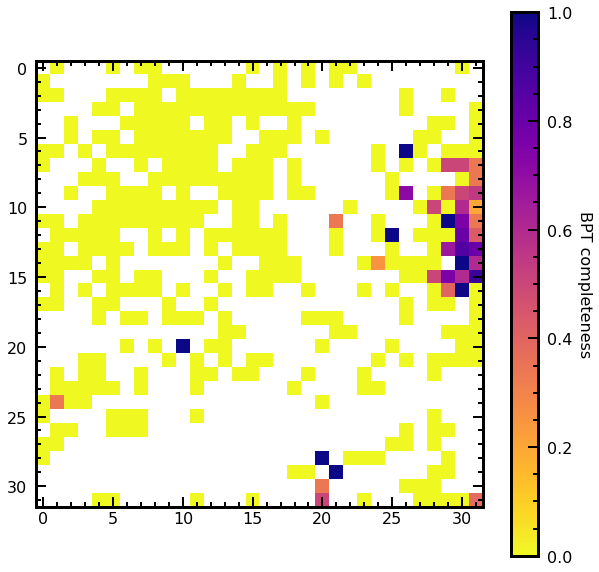

/tmp/ipykernel_340/810874292.py:17: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


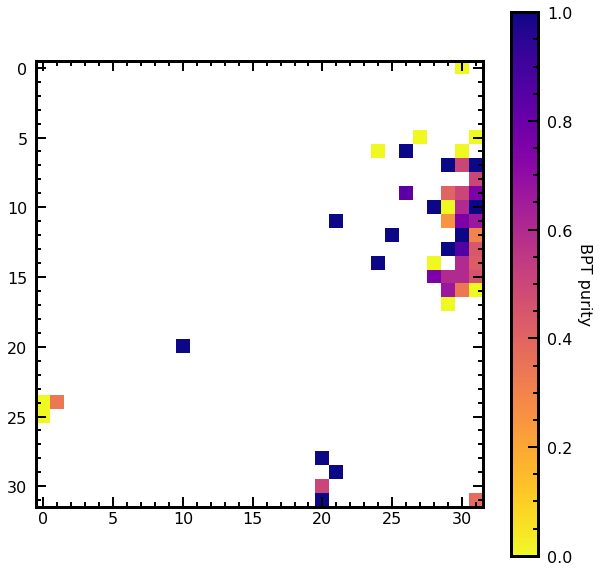

/tmp/ipykernel_340/810874292.py:28: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


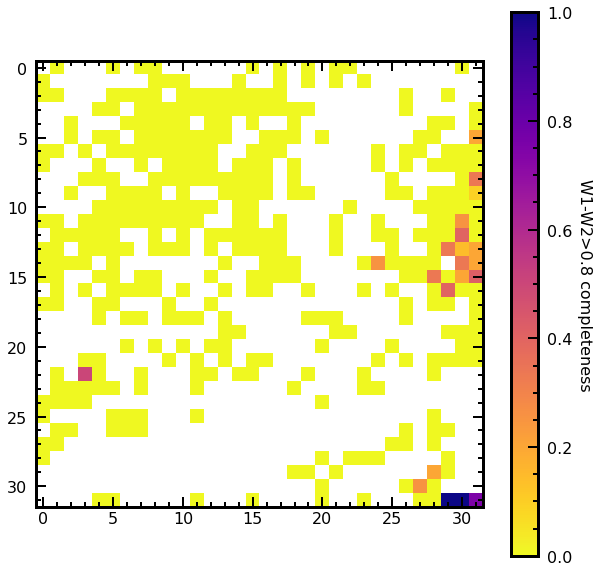

/tmp/ipykernel_340/810874292.py:39: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


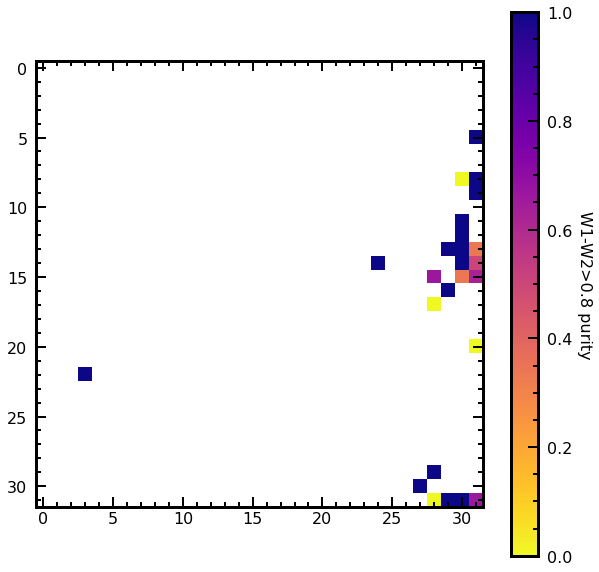

In [92]:
#BPT Acc.
fig,axs = plt.subplots(figsize=[10,10])
agn_accs = np.array([i[0] for i in cell_evals_ul]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_accs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('BPT completeness', rotation=270,labelpad=20)
plt.show()

#BPT Pur.
fig,axs = plt.subplots(figsize=[10,10])
agn_purs = np.array([i[1] for i in cell_evals_ul]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_purs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('BPT purity', rotation=270,labelpad=20)
plt.show()

#WISE Acc.
fig,axs = plt.subplots(figsize=[10,10])
agn_accs = np.array([i[2] for i in cell_evals_ul]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_accs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('W1-W2>0.8 completeness', rotation=270,labelpad=20)
plt.show()

#WISE Pur.
fig,axs = plt.subplots(figsize=[10,10])
agn_purs = np.array([i[3] for i in cell_evals_ul]).astype(float).reshape(32,32)
masked_array = np.ma.array(agn_purs, mask=np.isnan(agn_accs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('W1-W2>0.8 purity', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_65/628232476.py:9: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


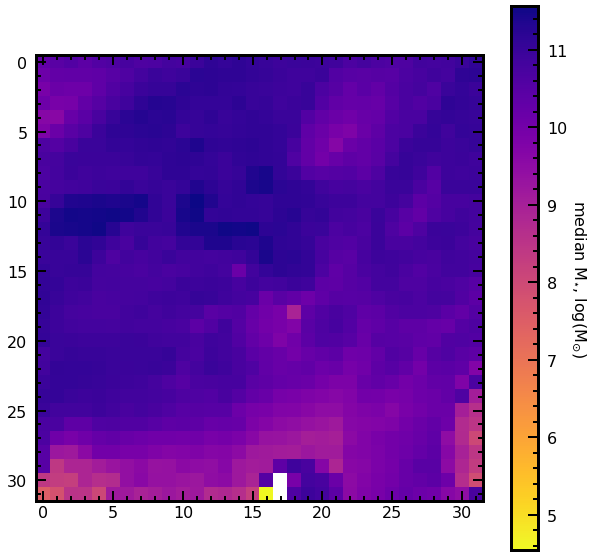

  0%|          | 0/1024 [00:00<?, ?it/s]

/tmp/ipykernel_65/628232476.py:20: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


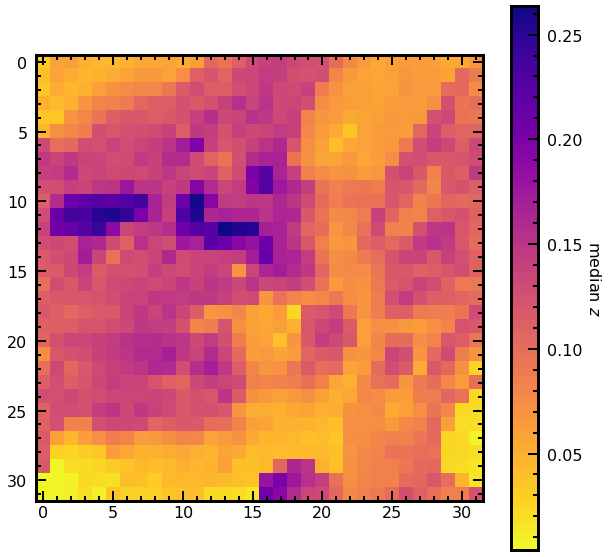

In [103]:
#Scientific validation of the map:
#Need generic functions to assess line fluxes where available and D4000 in all cases
#Science validation: What are the median stellar masses in each cell
med_Ms = np.array([np.median(som_df['total_mass_med'][som_df['best_cells']==cell][~np.isnan(som_df['total_mass_med'][som_df['best_cells']==cell])]) for cell in tqdm(range(1024))]).reshape(32,32)
fig,axs = plt.subplots(figsize=[10,10])
plt.imshow(med_Ms,cmap='plasma_r')
masked_array = np.ma.array(med_Ms, mask=np.isnan(med_Ms))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median ${\mathrm{M_{\star}}}$, ${\mathrm{log(M_{\odot})}}$', rotation=270,labelpad=20)
plt.show()
#Science validation: What are the median zs in each cell
med_zs = np.array([np.median(som_df['z_spec'][som_df['best_cells']==cell][~np.isnan(som_df['z_spec'][som_df['best_cells']==cell])]) for cell in tqdm(range(1024))]).reshape(32,32)
fig,axs = plt.subplots(figsize=[10,10])
plt.imshow(med_zs,cmap='plasma_r')
masked_array = np.ma.array(med_zs, mask=np.isnan(med_zs))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median $z$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_134/1140246413.py:7: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("plasma_r").copy()
  cmap.set_bad('white',1.)


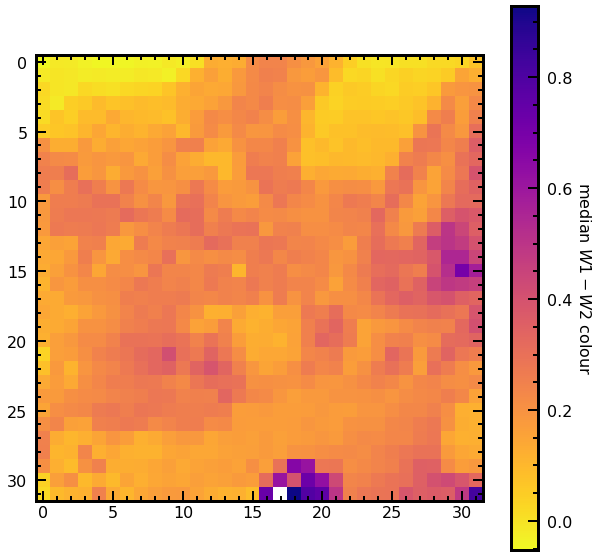

In [6]:
#Science validation: What are the median W1-W2 in each cell
med_ws = np.array([np.median((som_df['w1mpro']-som_df['w2mpro'])[som_df['best_cells']==cell][~np.isnan(som_df['w1mpro'][som_df['best_cells']==cell])]) for cell in tqdm(range(1024))]).reshape(32,32)
fig,axs = plt.subplots(figsize=[10,10])
plt.imshow(med_ws,cmap='plasma_r')
masked_array = np.ma.array(med_ws, mask=np.isnan(med_ws))
cmap = mpl.cm.plasma_r
cmap.set_bad('white',1.)
a = axs.imshow(masked_array, interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median $W1-W2$ colour', rotation=270,labelpad=20)
plt.show()

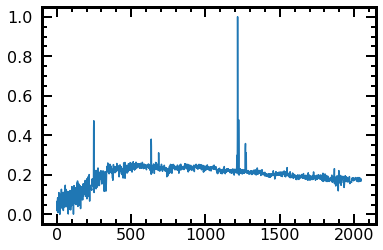

{'o3': 0.13144548439716927, 'n2': 0.4938031785558086, 'h_alpha': 1.3171237007445242, 'h_beta': 0.29651923055630114}
[1.23605289]


In [198]:
o3_el = 5008.240
n2_el = 6585.27
ha_el = 6564.61
hb_el = 4862.68
wl_2A = np.linspace(3000,9000,2048)

def flux_est(spect, line, wl, delta=10):
    idx_x = np.where((wl < line + delta) & (wl > line - delta))[0]
    xx = range(len(idx_x)) * u.GHz
    tp = spect[idx_x]
    mu = (tp[0] + tp[1] + tp[-1] + tp[-2]) / 4
    tp = tp - mu
    flux = tp * u.GHz
    flux = flux.reshape(1,-1)d
    uncertainty = StdDevUncertainty(flux)
    spec1d = Spectrum1D(spectral_axis=xx, flux=flux, uncertainty=uncertainty)
    fx = line_flux(spec1d, SpectralRegion(12 * u.GHz, 2 * u.GHz))
    # return fx.value
    return np.abs(fx.value)

def estimate_emission_lines(x):
    o3 = flux_est(x, o3_el, wl_2A)
    n2 = flux_est(x, n2_el, wl_2A)
    h_alpha = flux_est(x, ha_el, wl_2A)
    h_beta = flux_est(x, hb_el, wl_2A)
    return {"o3": o3, "n2": n2, "h_alpha": h_alpha, "h_beta": h_beta}
#Test BPT on the emission lines here
plt.plot(X_train[12])
plt.show()
print(estimate_emission_lines(X_train[12]))

def d4k_calc(sp,wl):
    blue_mask = (wl>=3750)&(wl<=3950)
    red_mask = (wl>=4050) &(wl<=4250)
    d4k = sum(sp[red_mask])/sum(sp[blue_mask])
    return d4k

print(d4k_calc(X_train[12],wl_2A))

In [199]:
#Compute d4k and emmlines for each of the template spectra:
wl = np.linspace(3000,9000,2048)

print('calculating for templates')
#temp_bpt = np.array([estimate_emission_lines(sp) for sp in tqdm(decoded_prototypes)])
temp_d4k = np.array([d4k_calc(sp,wl) for sp in tqdm(decoded_prototypes)])

print('calculating for all')
#X_bpt = np.array([estimate_emission_lines(sp) for sp in tqdm(X_train)])
X_d4k = np.array([d4k_calc(sp,wl) for sp in tqdm(X_train)])

print(len(temp_bpt))
print(len(temp_d4k))
#print(len(X_bpt))
print(len(X_d4k))

calculating for templates


  0%|          | 0/1024 [00:00<?, ?it/s]

calculating for all


  0%|          | 0/709001 [00:00<?, ?it/s]

/tmp/ipykernel_65/2110589555.py:35: RuntimeWarning: divide by zero encountered in true_divide
  d4k = sum(sp[red_mask])/sum(sp[blue_mask])
/tmp/ipykernel_65/2110589555.py:35: RuntimeWarning: invalid value encountered in true_divide
  d4k = sum(sp[red_mask])/sum(sp[blue_mask])


1024
1024
709001


  0%|          | 0/1024 [00:00<?, ?it/s]

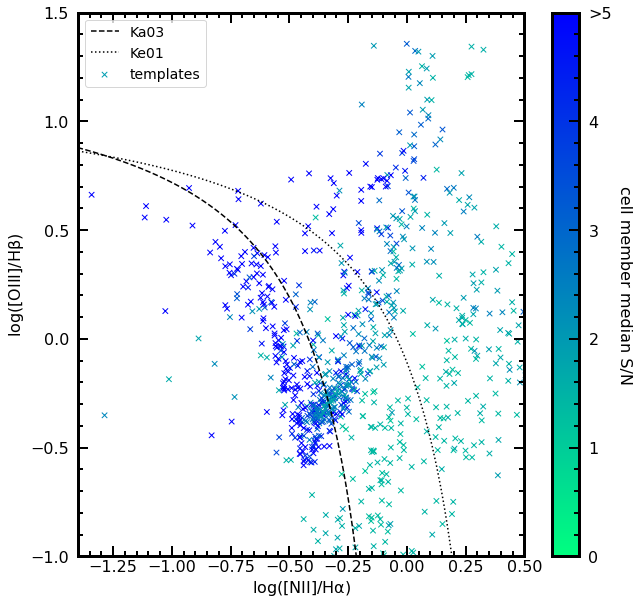

In [166]:
def ratios(cell):
    o3,n2,ha,hb = temp_bpt[cell]['o3'],temp_bpt[cell]['n2'],temp_bpt[cell]['h_alpha'],temp_bpt[cell]['h_beta']
    n2oha = np.log10(n2/ha)
    o3ohb = np.log10(o3/hb)
    if o3ohb<(0.61/(n2oha-0.05)+1.3): #SF
        spectype = 0
    if (o3ohb>(0.61/(n2oha-0.05)+1.3)) and (o3ohb<(0.61/(n2oha-0.47)+1.19)): #Composite
        spectype = 1
    if (o3ohb>(0.61/(n2oha-0.47)+1.19)): #AGN
        spectype = 2
    return n2oha,o3ohb,spectype
val_ratios = np.array([ratios(cell) for cell in tqdm(range(1024))])
xsp = np.linspace(-1.5,0.25,200)
fig,axs = plt.subplots(figsize=[10,10])
axs.plot(xsp[xsp<0],np.array(0.61/(xsp-0.05)+1.3)[xsp<0],linestyle='dashed',label='Ka03',c='black')
axs.plot(xsp,0.61/(xsp-0.47)+1.19,linestyle='dotted',label='Ke01',c='black')
a = axs.scatter(val_ratios[:,0],val_ratios[:,1],c=sns,cmap='winter_r',label='templates',s=30,linewidth=1,marker='x',vmin=0,vmax=5)
cb = plt.colorbar(a)
cb.ax.set_ylabel('cell member median S/N', rotation=270,labelpad=20)
cb.ax.set_yticks([0,1,2,3,4,5],[0,1,2,3,4,'>5'])
axs.legend()
axs.set_ylim(-1,1.5)
axs.set_xlim(-1.4,0.5)
axs.set_xlabel(r'log([NII]/H$\mathrm{\alpha}$)')
axs.set_ylabel(r'log([OIII]/H$\mathrm{\beta}$)')
plt.show()

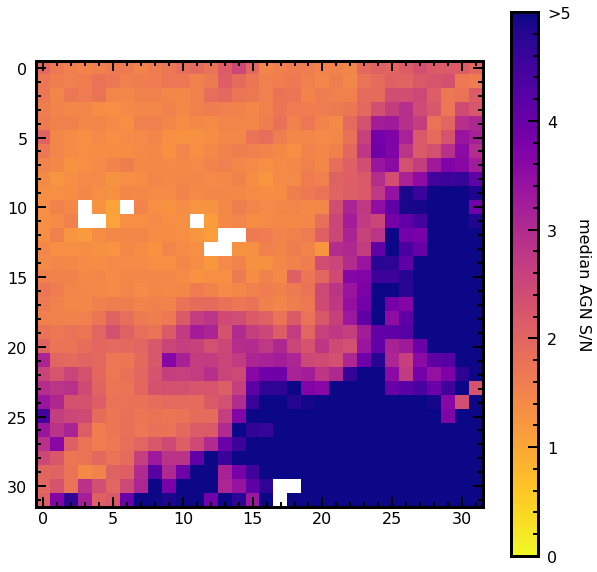

In [196]:
#Science validation: What are the median s/n in each cell
#sns = np.array([som_df['agn_sn'][som_df['best_cells']==cell] for cell in range(1024)])
#sns = np.array([np.median(i[~np.isnan(i)]) for i in sns]).reshape(32,32)

fig,axs = plt.subplots(figsize=[10,10])
a = plt.imshow(sns,cmap='plasma_r',vmin=0,vmax=5)
cbar = plt.colorbar(a)
cbar.ax.set_yticks([0,1,2,3,4,5],[0,1,2,3,4,'>5'])
cbar.ax.set_ylabel('median AGN S/N', rotation=270,labelpad=20)
plt.show()

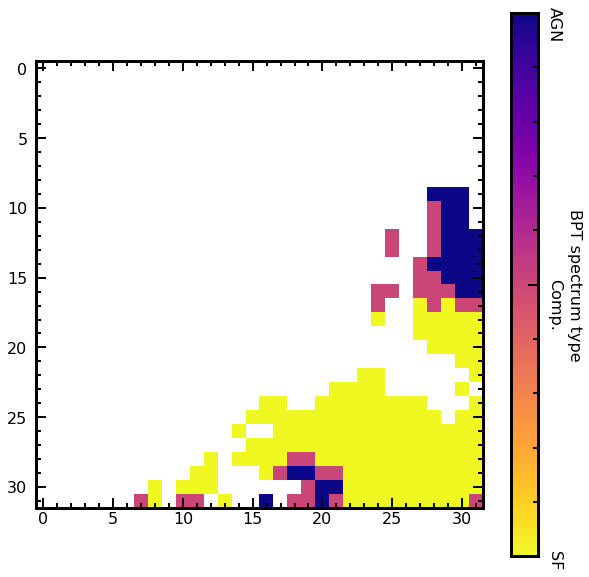

In [243]:
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(np.array([i[2] if j>=5 else 'NaN' for i,j in zip(val_ratios,sns.flatten())]).astype(float).reshape(32,32), interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('BPT spectrum type', rotation=270,labelpad=20)
labels = ['high', 'low', 37337]
cbar.ax.set_yticks([0,1,2],['SF','Comp.','AGN'], rotation='270')
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

/tmp/ipykernel_65/3869237805.py:21: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  return scipy.stats.mode(cell_ratios)[0]
/tmp/ipykernel_65/3869237805.py:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  label_map = np.array([choose_label(cell) for cell in tqdm(range(1024))])#.reshape(32,32)


(1024,)


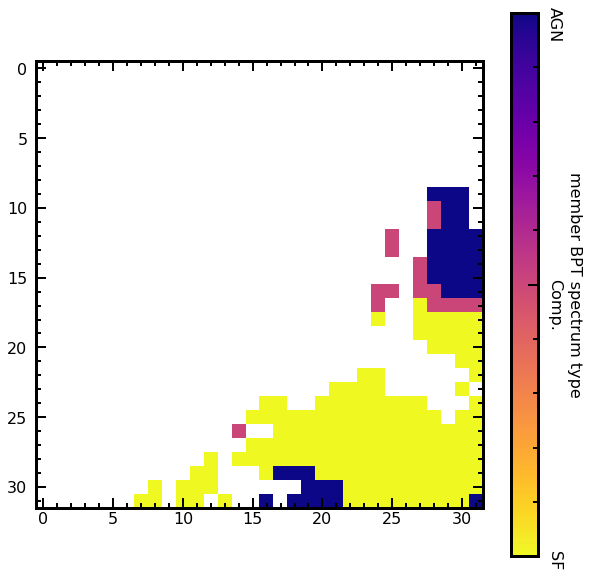

In [240]:
#using the ratios extracted with Henry's code instead of the tabulated values
# def ratios(sp):
#     o3,n2,ha,hb = sp['o3'],sp['n2'],sp['h_alpha'],sp['h_beta']
#     if o3>0 and n2>0 and ha>0 and hb>0:
#         n2oha = np.log10(n2/ha)
#         o3ohb = np.log10(o3/hb)
#         if o3ohb<(0.61/(n2oha-0.05)+1.3): #SF
#             spectype = 0
#         if (o3ohb>(0.61/(n2oha-0.05)+1.3)) and (o3ohb<(0.61/(n2oha-0.47)+1.19)): #Composite
#             spectype = 1
#         if (o3ohb>(0.61/(n2oha-0.47)+1.19)): #AGN
#             spectype = 2
#         return n2oha,o3ohb,spectype
#     else:
#         return 'NaN','NaN',-1
# X_ratios = np.array([ratios(sp) for sp in tqdm(X_bpt)])

def choose_label(cell):
    if sns.flatten()[cell]>=5:
        cell_ratios = X_ratios[all_cell_best==cell][:,2].astype(float)
        return scipy.stats.mode(cell_ratios)[0]
    else:
        return 'NaN'

label_map = np.array([choose_label(cell) for cell in tqdm(range(1024))])#.reshape(32,32)
print(label_map.shape)

fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(label_map.astype(float).reshape(32,32), interpolation='nearest', cmap='plasma_r')
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('member BPT spectrum type', rotation=270,labelpad=20)
cbar.ax.set_yticks([0,1,2],['SF','Comp.','AGN'], rotation='270')
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

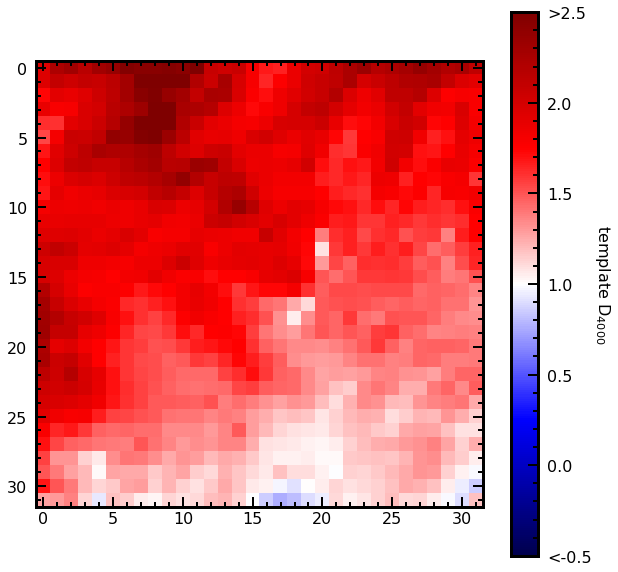

In [230]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([i for i in X_d4k[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    d4k_val = np.median(vals)
    return d4k_val
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values d4k as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.5,vmax=2.5)
cbar = plt.colorbar(a)
cbar.ax.set_yticks([-0.5,0.0,0.5,1.0,1.5,2.0,2.5],['<-0.5',0.0,0.5,1.0,1.5,2.0,'>2.5'])
cbar.ax.set_ylabel('template $\mathrm{D_{4000}}$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

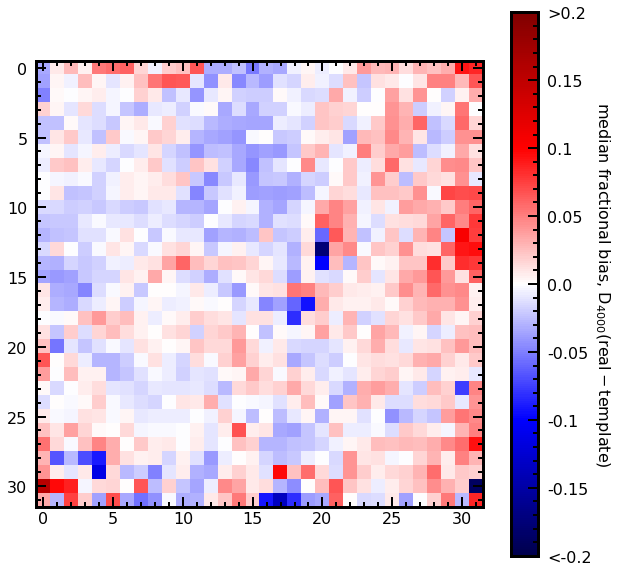

In [213]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([(i-td4k)/td4k for i in X_d4k[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    d4k_val = np.median(vals)
    return d4k_val
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values d4k as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.2,vmax=0.2)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional bias, $\mathrm{D_{4000}(real-template)}$', rotation=270,labelpad=20)
cbar.ax.set_yticks([-0.2,-0.15,-0.1,-0.05,0.0,0.05,0.1,0.15,0.2],['<-0.2',-0.15,-0.1,-0.05,0.0,0.05,0.1,0.15,'>0.2'])
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

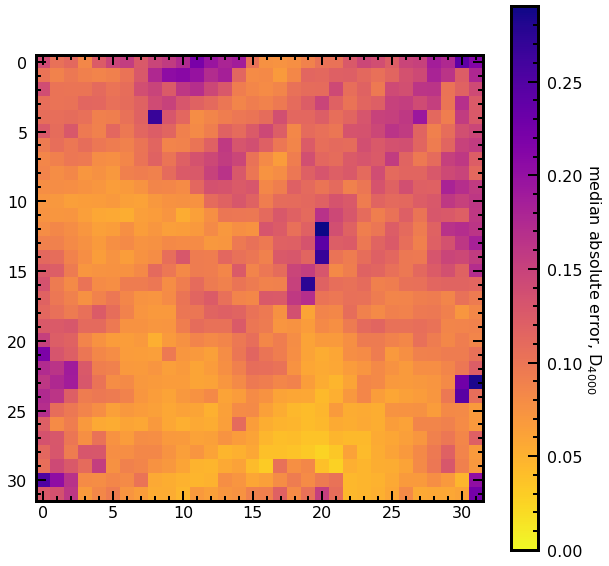

In [214]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([np.abs(i-td4k) for i in X_d4k[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    d4k_val = np.median(vals)
    return d4k_val
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values d4k as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='plasma_r',vmin=0)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median absolute error, $\mathrm{D_{4000}}$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

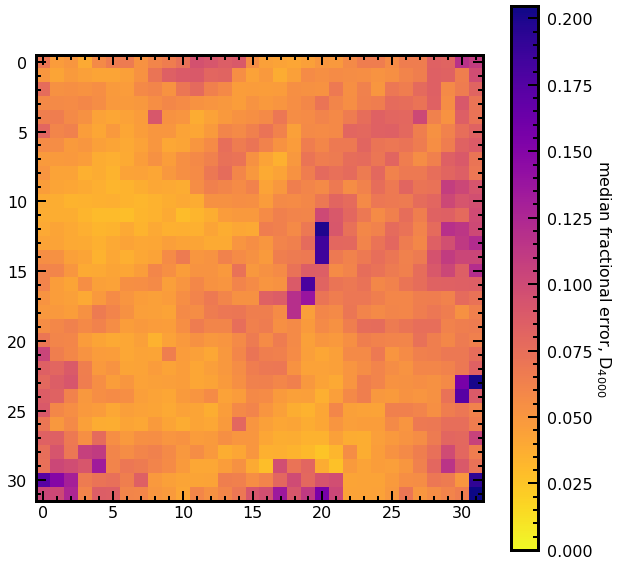

In [215]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([np.abs(i-td4k)/td4k for i in X_d4k[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    d4k_percent_err = np.median(vals)
    return d4k_percent_err
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the %err for d4k as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap=cmap,vmin=0)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional error, $\mathrm{D_{4000}}$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

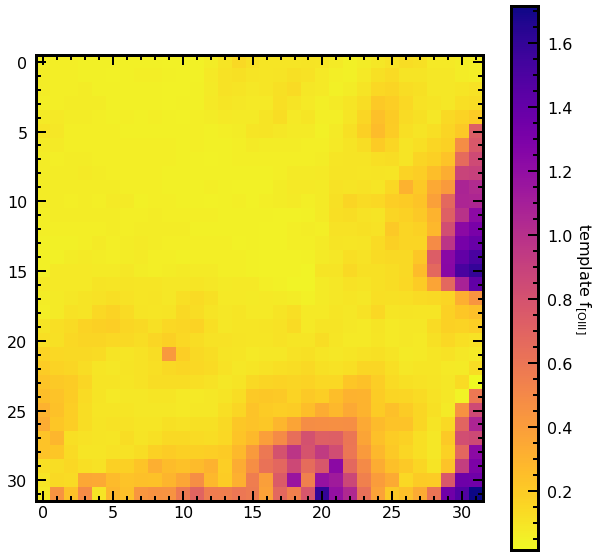

  0%|          | 0/1024 [00:00<?, ?it/s]

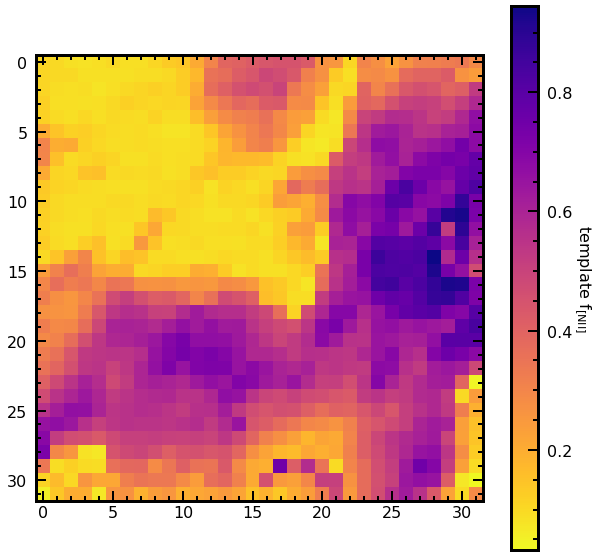

  0%|          | 0/1024 [00:00<?, ?it/s]

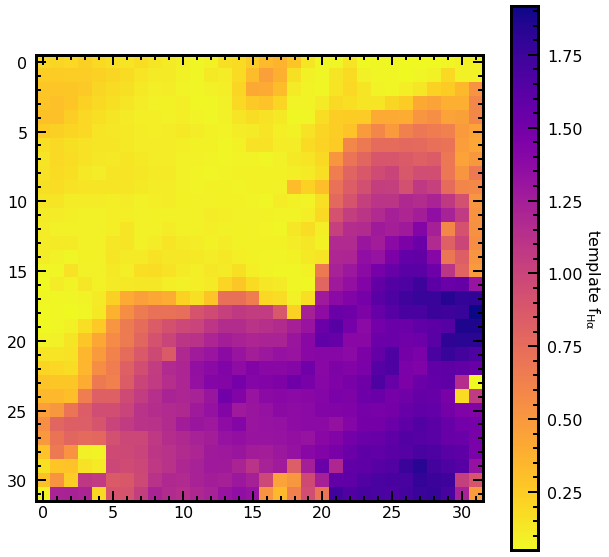

  0%|          | 0/1024 [00:00<?, ?it/s]

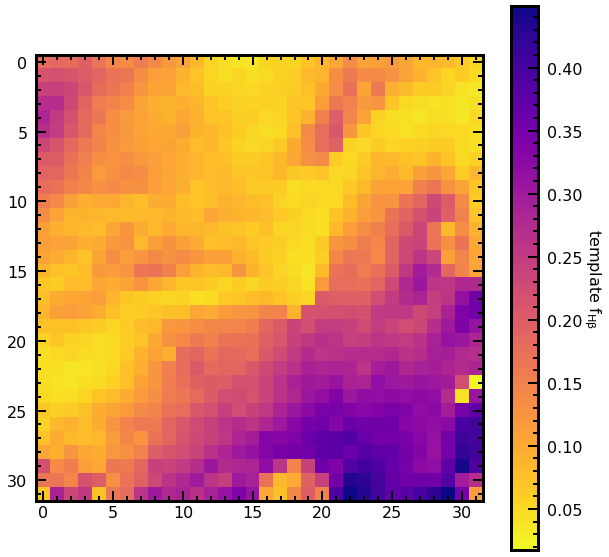

In [237]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([i['o3'] for i in X_bpt[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    vals = np.median(vals)
    return vals
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='plasma_r')#,vmin=-0.5,vmax=2.5)
cbar = plt.colorbar(a)
#cbar.ax.set_yticks([-0.5,0.0,0.5,1.0,1.5,2.0,2.5],['<-0.5',0.0,0.5,1.0,1.5,2.0,'>2.5'])
cbar.ax.set_ylabel('template $\mathrm{f_{[OIII]}}$', rotation=270,labelpad=20)
plt.show()

#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([i['n2'] for i in X_bpt[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    vals = np.median(vals)
    return vals
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='plasma_r')#,vmin=-0.5,vmax=2.5)
cbar = plt.colorbar(a)
#cbar.ax.set_yticks([-0.5,0.0,0.5,1.0,1.5,2.0,2.5],['<-0.5',0.0,0.5,1.0,1.5,2.0,'>2.5'])
cbar.ax.set_ylabel('template $\mathrm{f_{[NII]}}$', rotation=270,labelpad=20)
plt.show()

#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([i['h_alpha'] for i in X_bpt[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    vals = np.median(vals)
    return vals
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='plasma_r')#,vmin=-0.5,vmax=2.5)
cbar = plt.colorbar(a)
#cbar.ax.set_yticks([-0.5,0.0,0.5,1.0,1.5,2.0,2.5],['<-0.5',0.0,0.5,1.0,1.5,2.0,'>2.5'])
cbar.ax.set_ylabel(r'template $\mathrm{f_{H\alpha}}$', rotation=270,labelpad=20)
plt.show()

#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
def p_errs(cell):
    td4k = temp_d4k[cell]
    vals = np.array([i['h_beta'] for i in X_bpt[all_cell_best==cell]])
    vals = vals[~np.isnan(vals)]
    vals = np.median(vals)
    return vals
val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))])
#Science validation: What are the values o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs.reshape(32,32), interpolation='nearest', cmap='plasma_r')#,vmin=-0.5,vmax=2.5)
cbar = plt.colorbar(a)
#cbar.ax.set_yticks([-0.5,0.0,0.5,1.0,1.5,2.0,2.5],['<-0.5',0.0,0.5,1.0,1.5,2.0,'>2.5'])
cbar.ax.set_ylabel(r'template $\mathrm{f_{H\beta}}$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

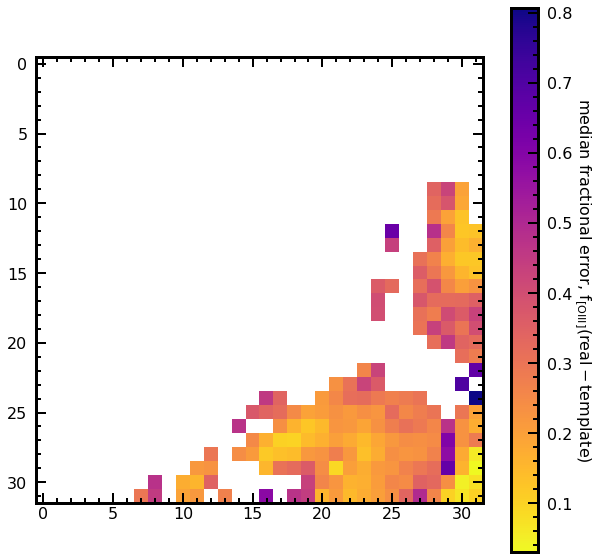

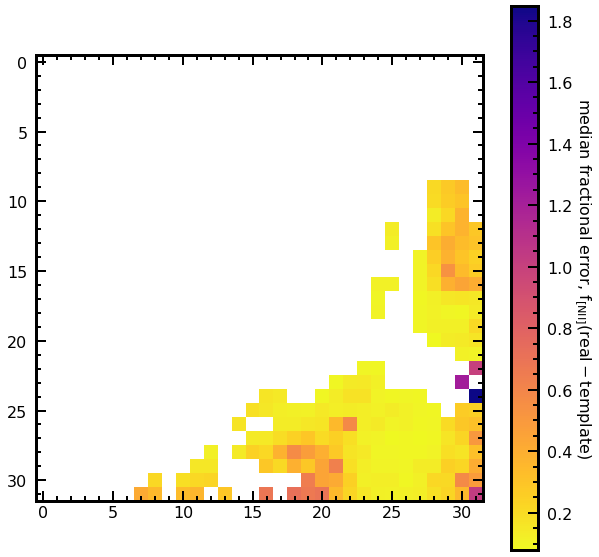

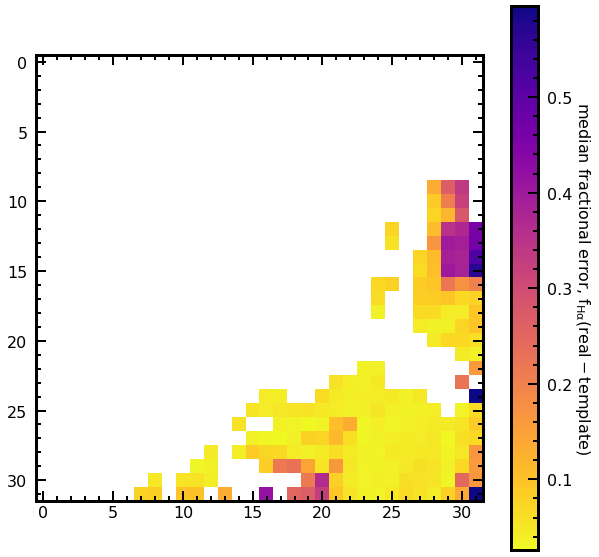

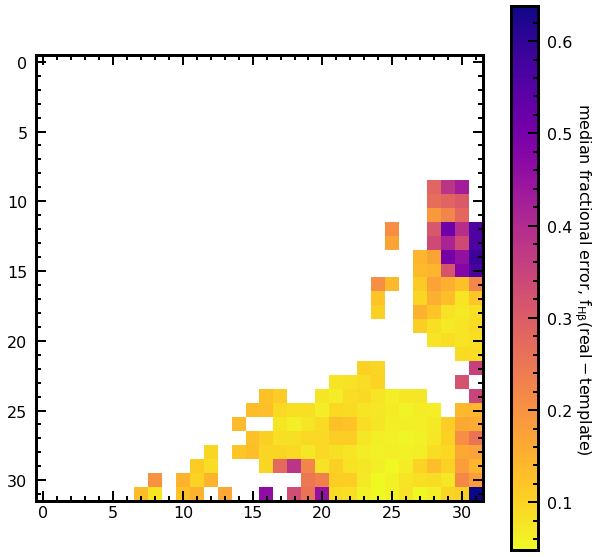

In [238]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
#X_bpt = np.array([estimate_emission_lines(sp) for sp in tqdm(X_train)])

def p_errs(cell):
    if sns.flatten()[cell]>=5:
        o3 = temp_bpt[cell]['o3']
        o3_percent_err = np.median([np.abs(i['o3']-o3)/o3 for i in X_bpt[all_cell_best==cell]])
        n2 = temp_bpt[cell]['n2']
        n2_percent_err = np.median([np.abs(i['n2']-n2)/n2 for i in X_bpt[all_cell_best==cell]])
        ha = temp_bpt[cell]['h_alpha']
        ha_percent_err = np.median([np.abs(i['h_alpha']-ha)/ha for i in X_bpt[all_cell_best==cell]])
        hb = temp_bpt[cell]['h_beta']
        hb_percent_err = np.median([np.abs(i['h_beta']-hb)/hb for i in X_bpt[all_cell_best==cell]])
        return [o3_percent_err,n2_percent_err,ha_percent_err,hb_percent_err]
    else:
        return ['NaN','NaN','NaN','NaN']

val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))]).astype(float)


#Science validation: What are the frac for o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,0].reshape(32,32), interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional error, $\mathrm{f_{[OIII]}(real-template)}$', rotation=270,labelpad=20)
plt.show()
#Science validation: What are the frac for n2 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,1].reshape(32,32), interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional error, $\mathrm{f_{[NII]}(real-template)}$', rotation=270,labelpad=20)
plt.show()
#Science validation: What are the frac for ha as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,2].reshape(32,32), interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel(r'median fractional error, $\mathrm{f_{H\alpha}(real-template)}$', rotation=270,labelpad=20)
plt.show()
#Science validation: What are the frac for hb as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,3].reshape(32,32), interpolation='nearest', cmap=cmap)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel(r'median fractional error, $\mathrm{f_{H\beta}(real-template)}$', rotation=270,labelpad=20)
plt.show()

  0%|          | 0/1024 [00:00<?, ?it/s]

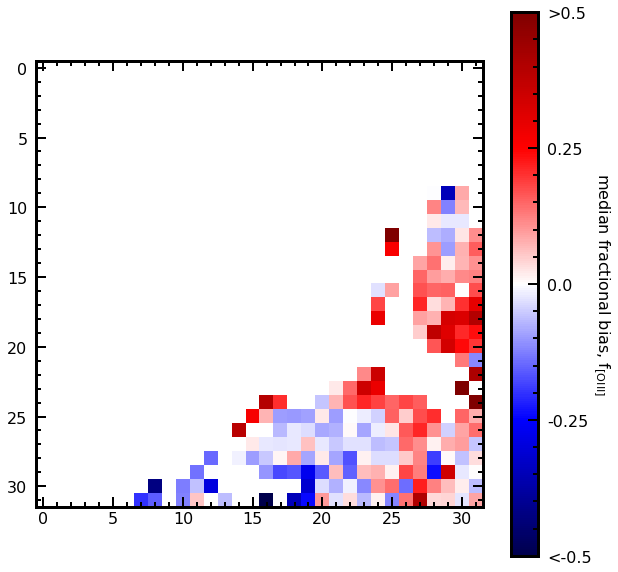

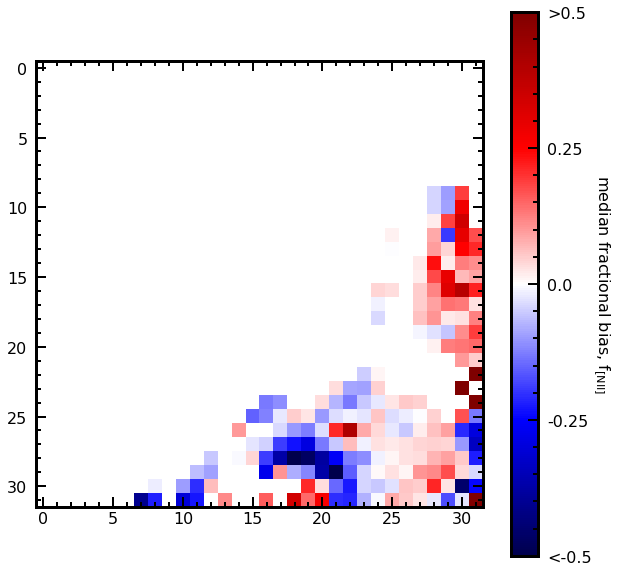

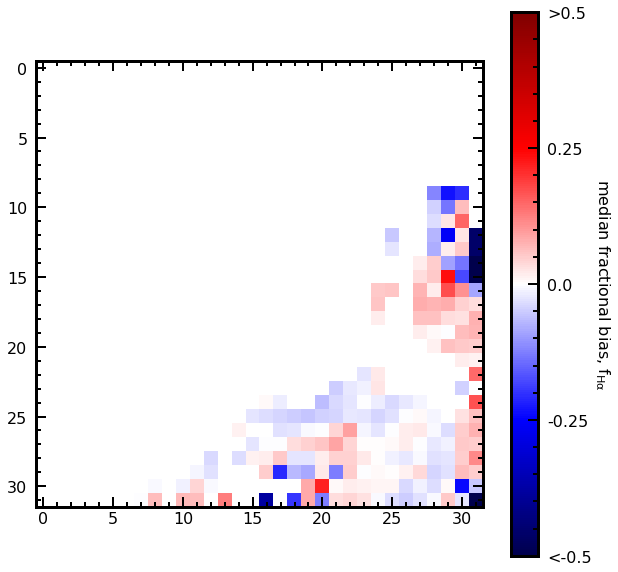

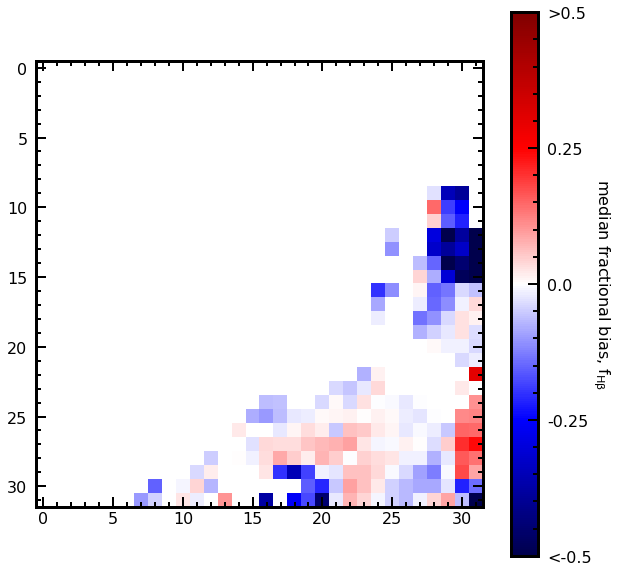

In [217]:
#Validate by comparing the temp bpts and d4ks to the galaxies belonging to each temp
#X_bpt = np.array([estimate_emission_lines(sp) for sp in tqdm(X_train)])

def p_errs(cell):
    if sns.flatten()[cell]>=5:
        o3 = temp_bpt[cell]['o3']
        o3_percent_err = np.median([(i['o3']-o3)/o3 for i in X_bpt[all_cell_best==cell]])
        n2 = temp_bpt[cell]['n2']
        n2_percent_err = np.median([(i['n2']-n2)/n2 for i in X_bpt[all_cell_best==cell]])
        ha = temp_bpt[cell]['h_alpha']
        ha_percent_err = np.median([(i['h_alpha']-ha)/ha for i in X_bpt[all_cell_best==cell]])
        hb = temp_bpt[cell]['h_beta']
        hb_percent_err = np.median([(i['h_beta']-hb)/hb for i in X_bpt[all_cell_best==cell]])
        return [o3_percent_err,n2_percent_err,ha_percent_err,hb_percent_err]
    else:
        return ['NaN','NaN','NaN','NaN']

val_p_errs = np.array([p_errs(cell) for cell in tqdm(range(1024))]).astype(float)

#Science validation: What are the frac for o3 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,0].reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional bias, $\mathrm{f_{[OIII]}}$', rotation=270,labelpad=20)
cbar.ax.set_yticks([-0.5,-0.25,0.0,0.25,0.5],['<-0.5',-0.25,0.0,0.25,'>0.5'])
plt.show()
#Science validation: What are the frac for n2 as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,1].reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel('median fractional bias, $\mathrm{f_{[NII]}}$', rotation=270,labelpad=20)
cbar.ax.set_yticks([-0.5,-0.25,0.0,0.25,0.5],['<-0.5',-0.25,0.0,0.25,'>0.5'])
plt.show()
#Science validation: What are the frac for ha as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,2].reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel(r'median fractional bias, $\mathrm{f_{H\alpha}}$', rotation=270,labelpad=20)
cbar.ax.set_yticks([-0.5,-0.25,0.0,0.25,0.5],['<-0.5',-0.25,0.0,0.25,'>0.5'])
plt.show()
#Science validation: What are the frac for hb as a function of cell
fig,axs = plt.subplots(figsize=[10,10])
a = axs.imshow(val_p_errs[:,3].reshape(32,32), interpolation='nearest', cmap='seismic',vmin=-0.5,vmax=0.5)
cbar = plt.colorbar(a)
cbar.ax.set_ylabel(r'median fractional bias, $\mathrm{f_{H\beta}}$', rotation=270,labelpad=20)
cbar.ax.set_yticks([-0.5,-0.25,0.0,0.25,0.5],['<-0.5',-0.25,0.0,0.25,'>0.5'])
plt.show()

In [248]:
#load in eRASS-1 counterparts
hdul = fits.open('../WolfSalvato_NWAY_v1_eRASS1_v-947_LS_v-10_all_matchflag1and2_2023_02_08.fits')
er_cp_table = Table(hdul[1].data)
er_cp_table

ERO_ID,ERO_RA,ERO_DEC,ERO_RADEC_ERR,LS10_RELEASE,LS10_BRICKID,LS10_OBJID,LS10_RA,LS10_DEC,LS10_Xray_proba,Separation_LS10_ERO,Separation_max,ncat,dist_bayesfactor,dist_post,bias_LS10_Xray_proba,p_single,p_any,p_i,match_flag
str32,float64,float64,float64,int16,int32,int32,float64,float64,float64,float32,float32,int16,float32,float32,float32,float32,float32,float32,int16
em01_001180_020_ML00001_002_c010,162.48866064384688,-88.99805103831876,0.7458287767874463,10000,63,2293,162.52769805169757,-88.99817322555776,0.9998161499239732,2.496358,2.496358,2,8.787118,0.11191081,4999.0,0.99841505,0.99841726,0.9986284,1
em01_001180_020_ML00002_002_c010,192.75854108410306,-88.69923243663992,1.178135745459448,10000,99,1475,192.76218405102955,-88.69986682692615,0.9998842368090624,2.3031185,2.3031185,2,9.9604645,0.65257096,9999.0,0.9999468,0.9999468,0.99998885,1
em01_001180_020_ML00004_002_c010,266.8457604312616,-88.76898079659881,3.1468233001856163,10000,106,4811,266.8629273495773,-88.7695766041861,0.9998573698670313,2.5224178,2.5224178,2,9.794315,0.561632,9999.0,0.9999219,0.99992216,0.9970287,1
em01_001180_020_ML00006_002_c010,150.32084582828693,-88.74459962847129,2.42555399778765,10000,95,274,150.3291522713222,-88.74354334953391,0.9995344811117229,3.8586764,3.8586764,2,9.610901,0.4564754,1999.0,0.9994047,0.9994052,0.9991869,1
em01_001180_020_ML00010_002_c010,8.56489672072183,-89.25283547015707,2.8411871674265603,10000,28,1701,8.639529193230466,-89.25304909596078,0.3001216574305499,3.5865,3.5865,2,9.676755,0.49427387,0.4288368,0.2953408,0.31513426,0.91086525,1
em01_001180_020_ML00011_002_c010,297.1013145441974,-88.85659803077753,5.861302879647329,10000,109,6105,297.1798320074893,-88.85875752805924,0.8976972716034602,9.601718,9.601718,2,8.81121,0.11754394,8.774216,0.5389014,0.5486483,0.9614717,1
em01_001180_020_ML00012_002_c010,295.54586339899953,-88.8582693028394,4.089438578656125,10000,109,4843,295.5682948620231,-88.8568332956428,0.9998267247917858,5.4145513,5.4145513,2,9.325848,0.30345508,4999.0,0.99954104,0.9995411,0.9998708,1
em01_001180_020_ML00013_002_c010,207.50939506220752,-88.7701801332085,1.660536098047982,10000,100,3510,207.51438107445796,-88.77030737588674,0.9996484542389398,0.5985255,0.5985255,2,10.4597025,0.85568416,2499.0,0.9999325,0.9999325,0.99999994,1
em01_001180_020_ML00017_002_c010,50.43122776680523,-89.11120135754695,3.4728760407129258,10000,54,2166,50.604774144929706,-89.1102629160905,0.9998382729561149,10.268087,10.268087,2,7.951458,0.018065006,4999.0,0.9892436,0.98924446,0.99992555,1


In [244]:
sdss_tab_for_check = Table.from_pandas(som_df)

In [255]:
coo_x = SkyCoord(er_cp_table['LS10_RA'][er_cp_table['LS10_DEC']>-90]*u.deg, er_cp_table['LS10_DEC'][er_cp_table['LS10_DEC']>-90]*u.deg)
coo_s = SkyCoord(sdss_tab_for_check['ra']*u.deg, sdss_tab_for_check['decl']*u.deg)
idx_s, d2d_s, d3d_s = coo_x.match_to_catalog_sky(coo_s)
print(len(idx_s))

1055596


4665


Text(0, 0.5, '#')

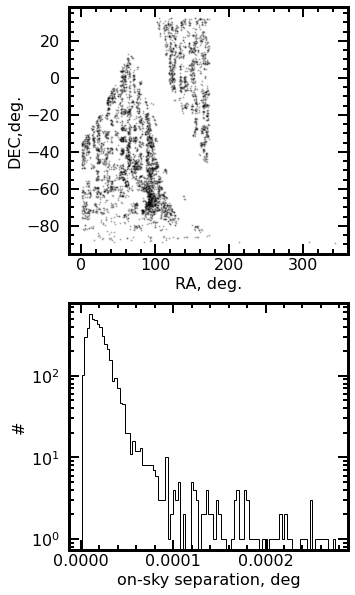

In [283]:
print(len(idx_s[d2d_s.deg<=0.000277778]))
fig,axs = plt.subplots(2,1,figsize=[5,10])
axs[0].scatter(coo_x[idx_s[d2d_s.deg<=0.000277778]].ra.deg,coo_x[idx_s[d2d_s.deg<=0.000277778]].dec.deg,marker='.',color='black',alpha=0.2,s=5,linewidth=1)
axs[0].set_xlabel('RA, deg.')
axs[0].set_ylabel('DEC,deg.')
axs[1].hist(d2d_s.deg[d2d_s.deg<=0.000277778],log=True,histtype='step',color='black',bins=100)
axs[1].set_xlabel('on-sky separation, deg')
axs[1].set_ylabel('#')

In [4]:
mask = agn_crit = (np.log10(10**(som_df['sfr_x2_gsw'].astype(float)))<np.log10(som_df['L_X'].astype(float))-(40.180456064458134+0.6))&(som_df['hard_band_ul_flags']==int(8))&(~np.isnan(som_df['spec_ind']))
indices = som_df['spec_ind'][mask].astype(int)
print(len(indices))

NameError: name 'np' is not defined

In [286]:
total = 0
for i in idx_s[d2d_s.deg<=0.000277778]:
    mask = (som_df.iloc[i]['hard_band_ul_flags']==int(8))&(~np.isnan(som_df.iloc[i]['spec_ind']))
    if mask:
        total += 1
print(total)

145
